In [2]:
IMAGE_PATH=r"C:\Users\thooy\Downloads\Evaluation_Set\1.png"

**EXTRACTING GREEN CHANNEL AND ENHANCING WITHOUT NOISE REDUCTION**


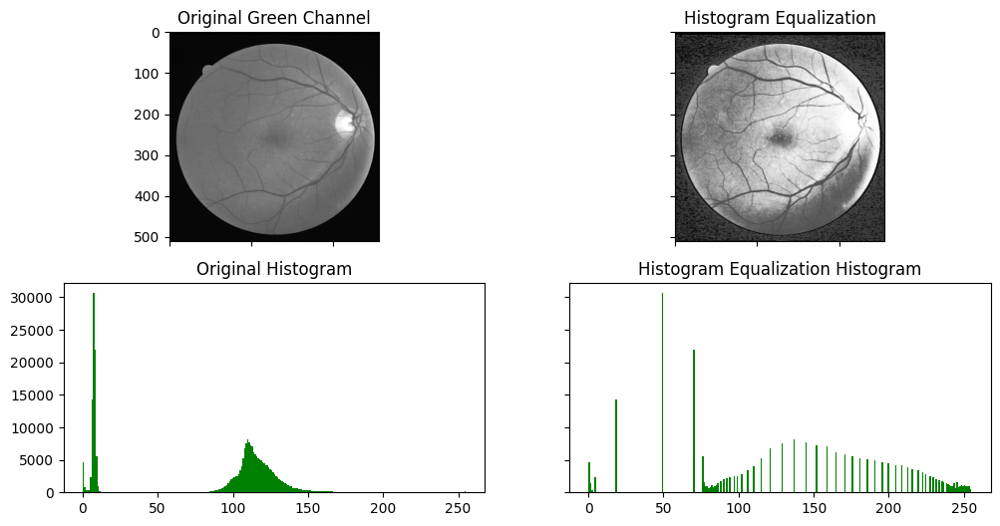

PSNR: 12.84525387376589
CII: 1.3303126788362731
Entropy: 3.7981243086841197


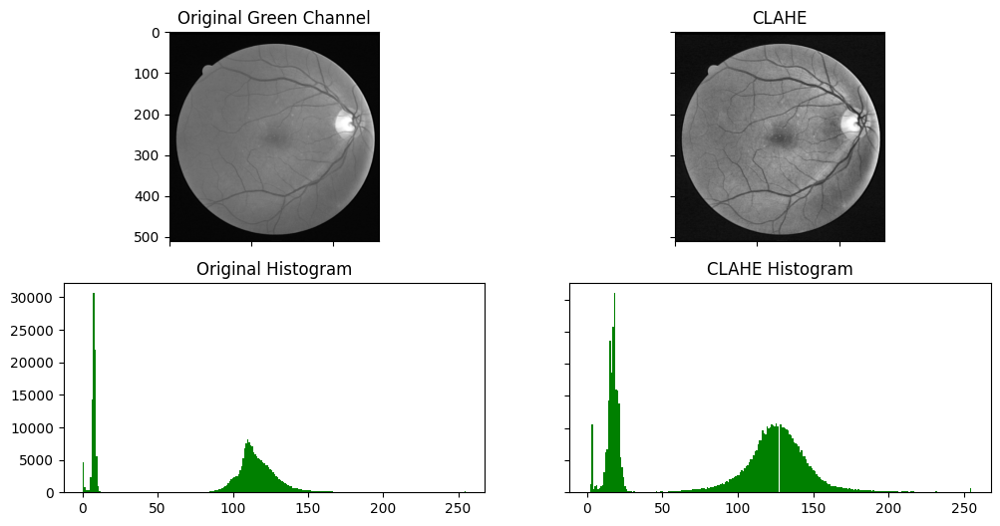

PSNR: 25.03322012863148
CII: 1.0238586869981094
Entropy: 4.5408564272361405


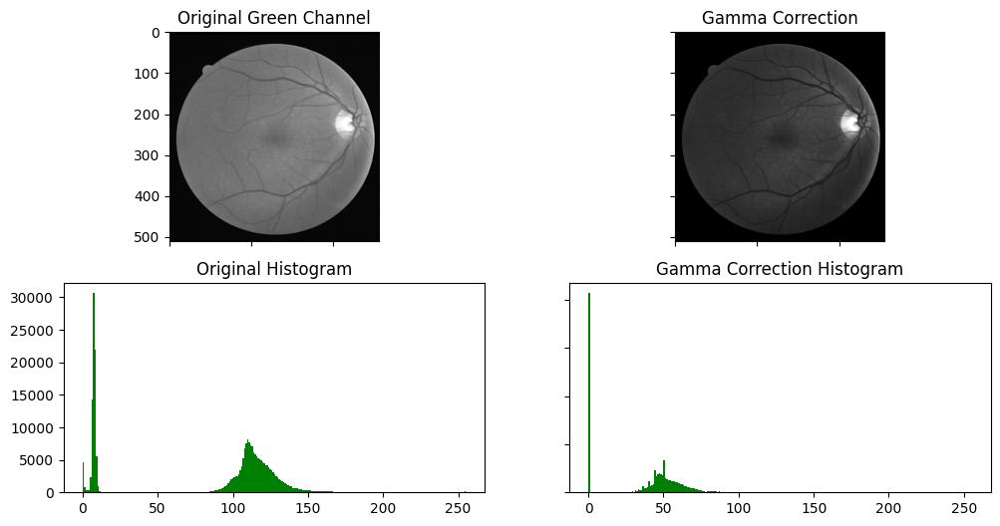

PSNR: 13.820991706375212
CII: 0.5824541213857349
Entropy: 3.302616950259909


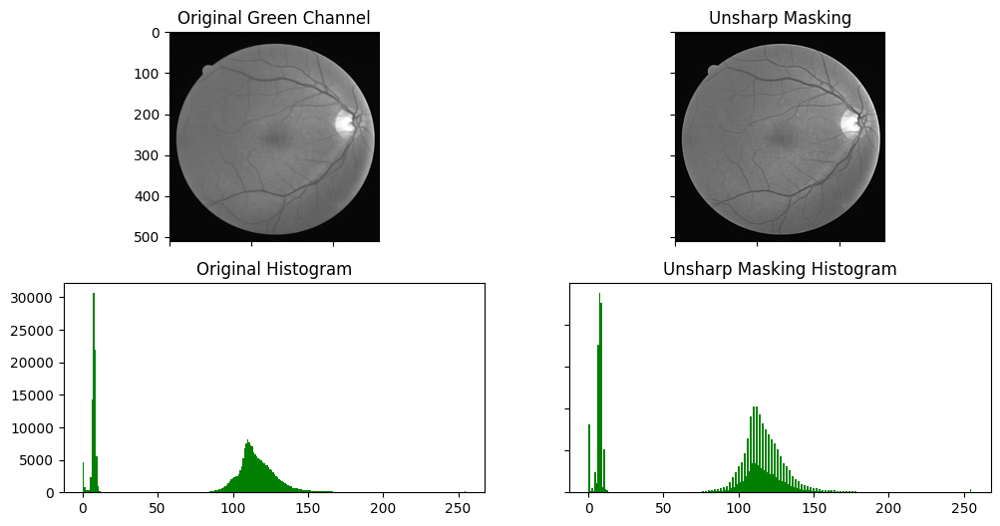

PSNR: 37.74067182159547
CII: 1.0132659862318958
Entropy: 3.899040388329582


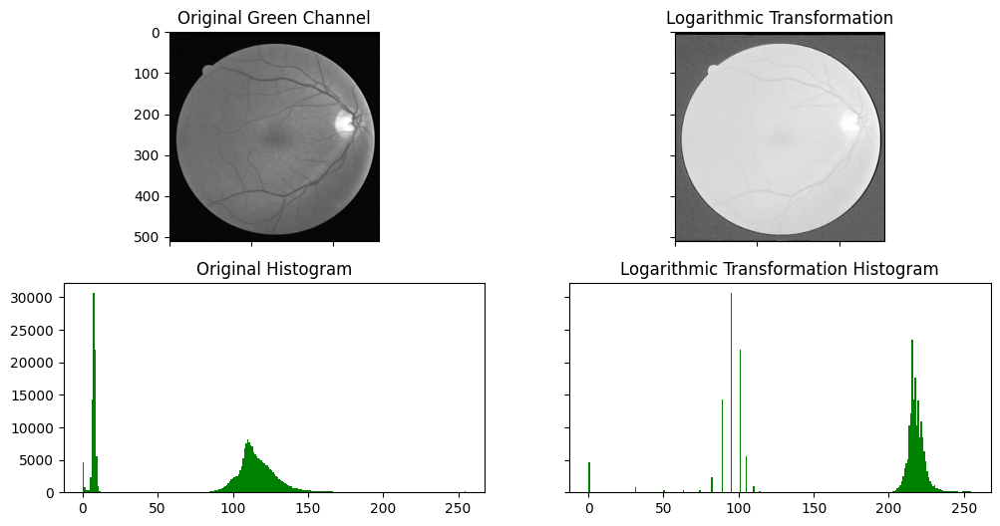

PSNR: 8.402070142388006
CII: 1.1408771306031709
Entropy: 3.2718930656866627


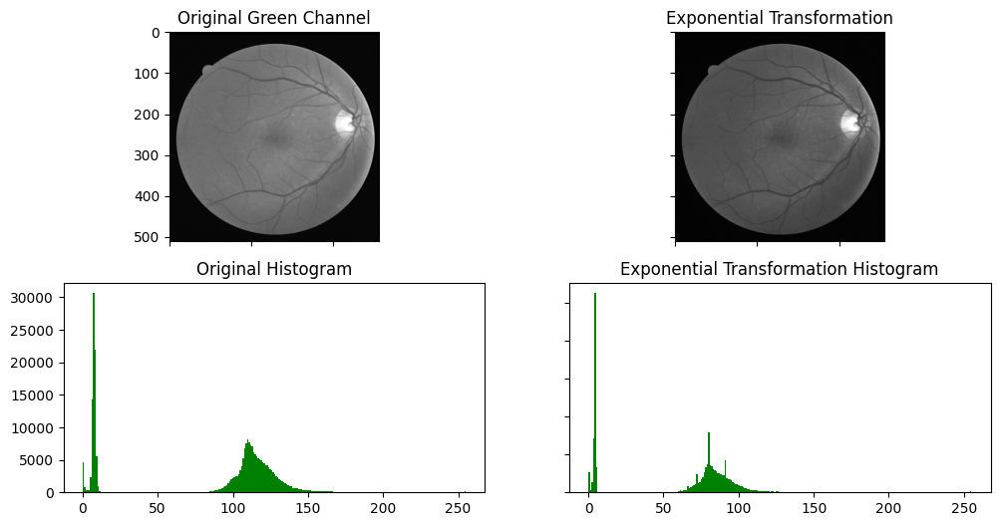

PSNR: 20.0471474444372
CII: 0.7822895959308478
Entropy: 3.672966090811093


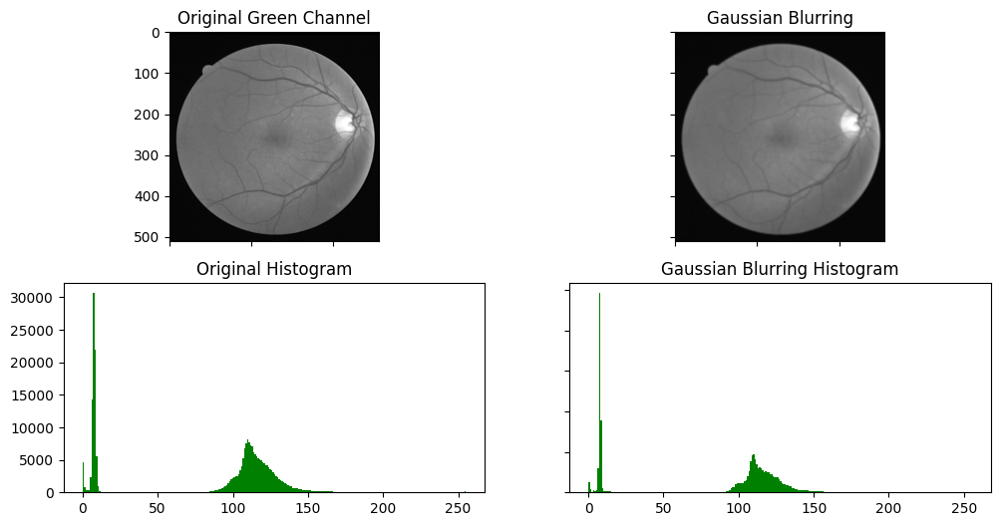

PSNR: 33.98071012980951
CII: 0.985541172753971
Entropy: 3.8107959973619083


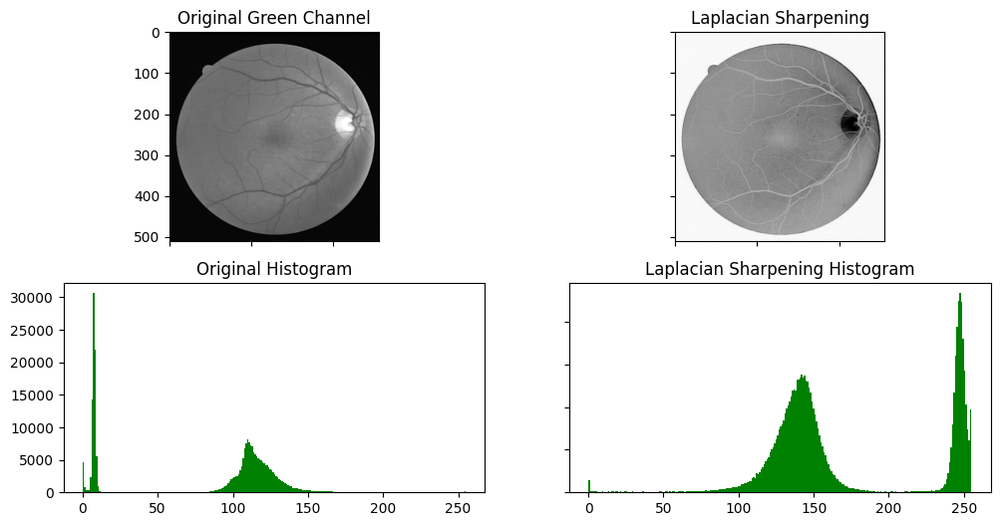

PSNR: 5.187479693306502
CII: 1.014331354157008
Entropy: 4.405123673151665


In [152]:
#note down value
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.stats import entropy as scipy_entropy

# Load the image and extract the green channel
image = cv2.imread(IMAGE_PATH)
green_channel = image[:, :, 1]

# Function to calculate entropy
def calculate_entropy(image):
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])
    hist = hist / np.sum(hist)
    return scipy_entropy(hist)

# Function to calculate Contrast Improvement Index (CII)
def calculate_cii(original, processed):
    cii = processed.std() / (original.std() + 1e-8)
    return cii

# Display function for side-by-side comparison
def display_results(original, processed, title):
    fig, axs = plt.subplots(2, 2, figsize=(12, 6))
    axs[0, 0].imshow(original, cmap='gray')
    axs[0, 0].set_title('Original Green Channel')
    axs[0, 1].imshow(processed, cmap='gray')
    axs[0, 1].set_title(title)

    # Histograms
    axs[1, 0].hist(original.ravel(), bins=256, color='green')
    axs[1, 0].set_title('Original Histogram')
    axs[1, 1].hist(processed.ravel(), bins=256, color='green')
    axs[1, 1].set_title(f'{title} Histogram')

    for ax in axs.flat:
        ax.label_outer()
    
    plt.show()

# 1. Histogram Equalization
equalized = cv2.equalizeHist(green_channel)
display_results(green_channel, equalized, 'Histogram Equalization')
print("PSNR:", psnr(green_channel, equalized))
print("CII:", calculate_cii(green_channel, equalized))
print("Entropy:", calculate_entropy(equalized))

# 2. Contrast Limited Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_image = clahe.apply(green_channel)
display_results(green_channel, clahe_image, 'CLAHE')
print("PSNR:", psnr(green_channel, clahe_image))
print("CII:", calculate_cii(green_channel, clahe_image))
print("Entropy:", calculate_entropy(clahe_image))

# 3. Gamma Correction
gamma = 2.0
gamma_corrected = np.array(255 * (green_channel / 255) ** gamma, dtype='uint8')
display_results(green_channel, gamma_corrected, 'Gamma Correction')
print("PSNR:", psnr(green_channel, gamma_corrected))
print("CII:", calculate_cii(green_channel, gamma_corrected))
print("Entropy:", calculate_entropy(gamma_corrected))

# 4. Unsharp Masking
blurred = cv2.GaussianBlur(green_channel, (9, 9), 10.0)
unsharp_image = cv2.addWeighted(green_channel, 1.5, blurred, -0.5, 0)
display_results(green_channel, unsharp_image, 'Unsharp Masking')
print("PSNR:", psnr(green_channel, unsharp_image))
print("CII:", calculate_cii(green_channel, unsharp_image))
print("Entropy:", calculate_entropy(unsharp_image))

# 5. Logarithmic Transformation
log_image = cv2.normalize(cv2.log(1 + green_channel.astype(np.float32)), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
display_results(green_channel, log_image, 'Logarithmic Transformation')
print("PSNR:", psnr(green_channel, log_image))
print("CII:", calculate_cii(green_channel, log_image))
print("Entropy:", calculate_entropy(log_image))

# 6. Exponential Transformation
exp_image = cv2.normalize(np.exp(green_channel.astype(np.float32) / 255.0), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
display_results(green_channel, exp_image, 'Exponential Transformation')
print("PSNR:", psnr(green_channel, exp_image))
print("CII:", calculate_cii(green_channel, exp_image))
print("Entropy:", calculate_entropy(exp_image))

# 7. Smoothing/Blurring (Gaussian Blur)
blur_image = cv2.GaussianBlur(green_channel, (9, 9), 0)
display_results(green_channel, blur_image, 'Gaussian Blurring')
print("PSNR:", psnr(green_channel, blur_image))
print("CII:", calculate_cii(green_channel, blur_image))
print("Entropy:", calculate_entropy(blur_image))

# 8. Sharpening (Laplacian)
laplacian = cv2.Laplacian(green_channel, cv2.CV_64F)
sharpened = cv2.convertScaleAbs(green_channel - laplacian)
display_results(green_channel, sharpened, 'Laplacian Sharpening')
print("PSNR:", psnr(green_channel, sharpened))
print("CII:", calculate_cii(green_channel, sharpened))
print("Entropy:", calculate_entropy(sharpened))


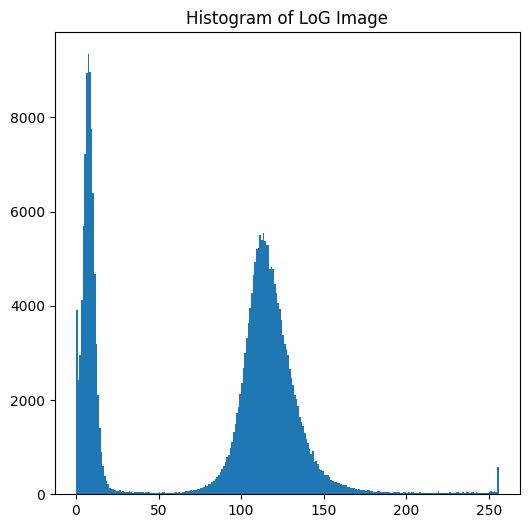

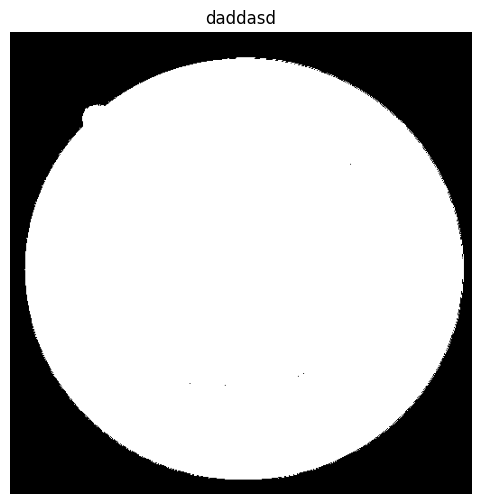

In [159]:
#sharpened=cv2.bitwise_not(sharpened)
plot_histogram(sharpened)
_, thresholded_img = cv2.threshold(sharpened,50 ,255, cv2.THRESH_BINARY)
plot_image(thresholded_img,"daddasd")

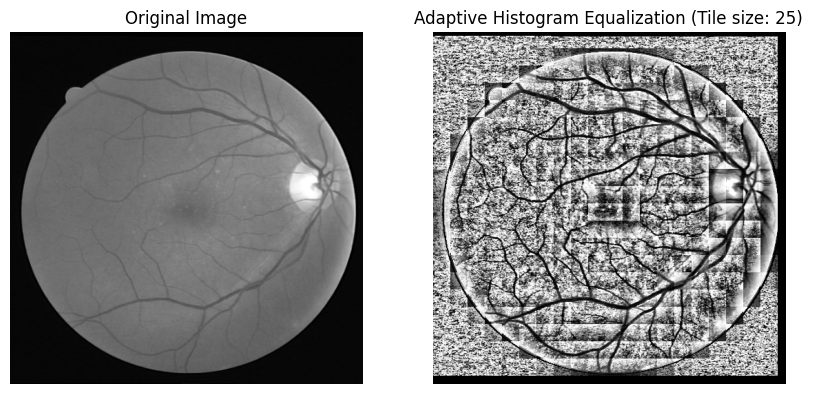

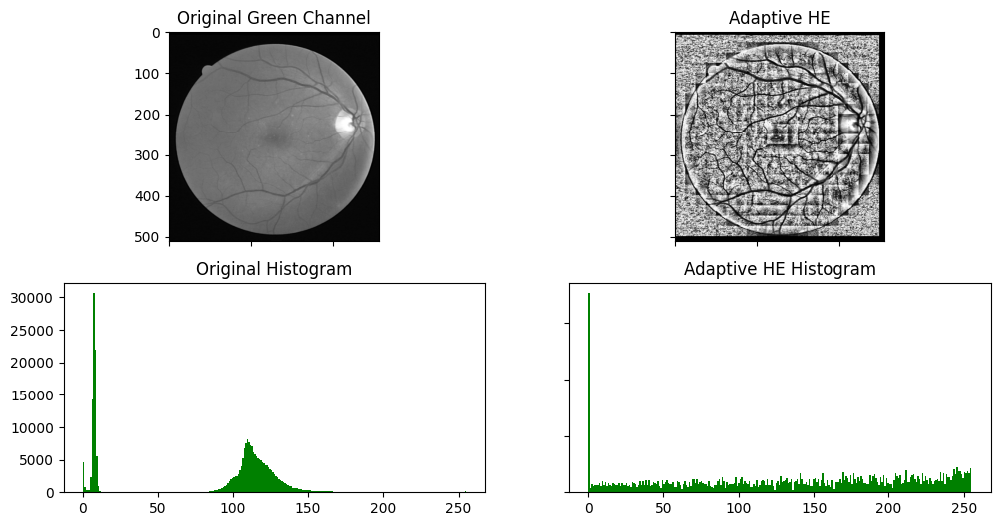

PSNR: 7.88916500828705
CII: 1.4892503846822793
Entropy: 5.343375639387749


In [153]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to apply AHE on an image
def adaptive_histogram_equalization(image, tile_size):
    # Get the dimensions of the image
    h, w = image.shape
    # Calculate the number of tiles along each dimension
    tiles_x = w // tile_size
    tiles_y = h // tile_size

    # Create an empty output image
    output_image = np.zeros((h, w), dtype=np.uint8)

    # Loop over each tile
    for i in range(tiles_y):
        for j in range(tiles_x):
            # Define the tile region
            x_start = j * tile_size
            y_start = i * tile_size
            x_end = x_start + tile_size
            y_end = y_start + tile_size

            # Extract the tile
            tile = image[y_start:y_end, x_start:x_end]
            
            # Apply histogram equalization to the tile
            equalized_tile = cv2.equalizeHist(tile)

            # Place the equalized tile back into the output image
            output_image[y_start:y_end, x_start:x_end] = equalized_tile

    # Return the output image
    return output_image

# Load an image and convert it to grayscale if necessary
image = cv2.imread(IMAGE_PATH)
image = image[:, :, 1]
# Apply AHE with a specified tile size
tile_size = 25 # Adjust tile size as needed
ahe_image = adaptive_histogram_equalization(image, tile_size)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ahe_image, cmap='gray')
plt.title(f'Adaptive Histogram Equalization (Tile size: {tile_size})')
plt.axis('off')

plt.show()
display_results(green_channel, ahe_image, 'Adaptive HE')
print("PSNR:", psnr(green_channel, ahe_image))
print("CII:", calculate_cii(green_channel, ahe_image))
print("Entropy:", calculate_entropy(ahe_image))


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.stats import entropy as scipy_entropy

# Load the image and extract the green channel
image = cv2.imread(IMAGE_PATH)
green_channel = image[:, :, 1]

# Function to calculate entropy
def calculate_entropy(image):
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])
    hist = hist / np.sum(hist)
    return scipy_entropy(hist)

# Function to calculate Contrast Improvement Index (CII)
def calculate_cii(original, processed):
    cii = processed.std() / (original.std() + 1e-8)
    return cii

# Display function for side-by-side comparison
def display_results(original, processed, title):
    fig, axs = plt.subplots(2, 2, figsize=(12, 6))
    axs[0, 0].imshow(original, cmap='gray')
    axs[0, 0].set_title('Original Green Channel')
    axs[0, 1].imshow(processed, cmap='gray')
    axs[0, 1].set_title(title)

    # Histograms
    axs[1, 0].hist(original.ravel(), bins=256, color='green')
    axs[1, 0].set_title('Original Histogram')
    axs[1, 1].hist(processed.ravel(), bins=256, color='green')
    axs[1, 1].set_title(f'{title} Histogram')

    for ax in axs.flat:
        ax.label_outer()
    
    plt.show()

# Function for frequency domain filtering
def frequency_filter(image, filter_type):
    # Perform Fourier transform
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    
    # Create filter
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.float32)
    
    # Filter type
    if filter_type == 'high-pass':
        mask[crow-30:crow+30, ccol-30:ccol+30] = 0
    elif filter_type == 'low-pass':
        mask[:crow-30, :] = mask[crow+30:, :] = mask[:, :ccol-30] = mask[:, ccol+30:] = 0
    elif filter_type == 'band-pass':
        mask[crow-15:crow+15, ccol-15:ccol+15] = 1
        mask[:crow-30, :] = mask[crow+30:, :] = mask[:, :ccol-30] = mask[:, ccol+30:] = 0

    # Apply filter
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return img_back

# High-Pass Filtering
high_pass = frequency_filter(green_channel, 'high-pass')
display_results(green_channel, high_pass, 'High-Pass Filtering')
print("PSNR:", psnr(green_channel, high_pass))
print("CII:", calculate_cii(green_channel, high_pass))
print("Entropy:", calculate_entropy(high_pass))

# Low-Pass Filtering
low_pass = frequency_filter(green_channel, 'low-pass')
display_results(green_channel, low_pass, 'Low-Pass Filtering')
print("PSNR:", psnr(green_channel, low_pass))
print("CII:", calculate_cii(green_channel, low_pass))
print("Entropy:", calculate_entropy(low_pass))

# Band-Pass Filtering
band_pass = frequency_filter(green_channel, 'band-pass')
display_results(green_channel, band_pass, 'Band-Pass Filtering')
print("PSNR:", psnr(green_channel, band_pass))
print("CII:", calculate_cii(green_channel, band_pass))
print("Entropy:", calculate_entropy(band_pass))

# Homomorphic Filtering
def homomorphic_filter(image):
    rows, cols = image.shape
    image_log = np.log1p(np.float32(image))
    dft = cv2.dft(image_log, flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # Create high-pass filter
    H = np.ones((rows, cols, 2), dtype=np.float32)
    radius = 30
    H[crow-radius:crow+radius, ccol-radius:ccol+radius] = 0.5

    # Apply filter and inverse FFT
    filtered_shift = dft_shift * H
    f_ishift = np.fft.ifftshift(filtered_shift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])
    img_back = np.exp(img_back) - 1
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    return img_back

# Apply Homomorphic Filtering
homomorphic_image = homomorphic_filter(green_channel)
display_results(green_channel, homomorphic_image, 'Homomorphic Filtering')
print("PSNR:", psnr(green_channel, homomorphic_image))
print("CII:", calculate_cii(green_channel, homomorphic_image))
print("Entropy:", calculate_entropy(homomorphic_image))


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to apply AHE on an image
def adaptive_histogram_equalization(image, tile_size):
    # Get the dimensions of the image
    h, w = image.shape
    # Calculate the number of tiles along each dimension
    tiles_x = w // tile_size
    tiles_y = h // tile_size

    # Create an empty output image
    output_image = np.zeros((h, w), dtype=np.uint8)

    # Loop over each tile
    for i in range(tiles_y):
        for j in range(tiles_x):
            # Define the tile region
            x_start = j * tile_size
            y_start = i * tile_size
            x_end = x_start + tile_size
            y_end = y_start + tile_size

            # Extract the tile
            tile = image[y_start:y_end, x_start:x_end]
            
            # Apply histogram equalization to the tile
            equalized_tile = cv2.equalizeHist(tile)

            # Place the equalized tile back into the output image
            output_image[y_start:y_end, x_start:x_end] = equalized_tile

    # Return the output image
    return output_image

# Load an image and convert it to grayscale if necessary
image = cv2.imread(IMAGE_PATH)
image = image[:, :, 1]
# Apply AHE with a specified tile size
tile_size = 25 # Adjust tile size as needed
ahe_image = adaptive_histogram_equalization(image, tile_size)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ahe_image, cmap='gray')
plt.title(f'Adaptive Histogram Equalization (Tile size: {tile_size})')
plt.axis('off')

plt.show()


**APPLYING NOISE REDUCTION FOLLOWED BY ENHANCEMENT**

In [ ]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter

# Load the image and extract the green channel
image = cv2.imread(IMAGE_PATH)
green_channel = image[:, :, 1]

# Display function for side-by-side comparison
def display_results(original, processed, title):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Green Channel')
    axs[1].imshow(processed, cmap='gray')
    axs[1].set_title(title)

    for ax in axs.flat:
        ax.axis('off')
    
    plt.show()

# 4. Bilateral Filter
# Bilateral filter preserves edges while smoothing the image
bilateral_filtered = cv2.bilateralFilter(green_channel, d=9, sigmaColor=75, sigmaSpace=75)
display_results(green_channel, bilateral_filtered, 'Bilateral Filter')

# 10. Adaptive Median Filter
# Define a function to apply an adaptive median filter
def adaptive_median_filter(image, max_size=7):
    # Initialize the output image
    filtered_image = np.copy(image)
    # Loop over increasing filter sizes
    for size in range(3, max_size + 1, 2):
        # Apply median filter
        median_filtered = median_filter(image, size=size)
        # Mask where the pixel intensity equals the original image
        mask = (image == filtered_image)
        # Update only masked regions with the new median values
        filtered_image[mask] = median_filtered[mask]
    return filtered_image

adaptive_median_filtered = adaptive_median_filter(green_channel)
display_results(green_channel, adaptive_median_filtered, 'Adaptive Median Filter')

# 5. Non-Local Means Filter
# Non-local means filter for noise reduction while preserving texture
non_local_means_filtered = cv2.fastNlMeansDenoising(green_channel, None, h=10, templateWindowSize=7, searchWindowSize=21)
display_results(green_channel, non_local_means_filtered, 'Non-Local Means Filter')


In [ ]:
#note down value
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.stats import entropy as scipy_entropy

# Load the image and extract the green channel
image = cv2.imread(IMAGE_PATH)
green_channel = adaptive_median_filtered

# Function to calculate entropy
def calculate_entropy(image):
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])
    hist = hist / np.sum(hist)
    return scipy_entropy(hist)

# Function to calculate Contrast Improvement Index (CII)
def calculate_cii(original, processed):
    cii = processed.std() / (original.std() + 1e-8)
    return cii

# Display function for side-by-side comparison
def display_results(original, processed, title):
    fig, axs = plt.subplots(2, 2, figsize=(12, 6))
    axs[0, 0].imshow(original, cmap='gray')
    axs[0, 0].set_title('Original Green Channel')
    axs[0, 1].imshow(processed, cmap='gray')
    axs[0, 1].set_title(title)

    # Histograms
    axs[1, 0].hist(original.ravel(), bins=256, color='green')
    axs[1, 0].set_title('Original Histogram')
    axs[1, 1].hist(processed.ravel(), bins=256, color='green')
    axs[1, 1].set_title(f'{title} Histogram')

    for ax in axs.flat:
        ax.label_outer()
    
    plt.show()

# 1. Histogram Equalization
equalized = cv2.equalizeHist(green_channel)
display_results(green_channel, equalized, 'Histogram Equalization')
print("PSNR:", psnr(green_channel, equalized))
print("CII:", calculate_cii(green_channel, equalized))
print("Entropy:", calculate_entropy(equalized))

# 2. Contrast Limited Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_image = clahe.apply(green_channel)
display_results(green_channel, clahe_image, 'CLAHE')
print("PSNR:", psnr(green_channel, clahe_image))
print("CII:", calculate_cii(green_channel, clahe_image))
print("Entropy:", calculate_entropy(clahe_image))

# 3. Gamma Correction
gamma = 2.0
gamma_corrected = np.array(255 * (green_channel / 255) ** gamma, dtype='uint8')
display_results(green_channel, gamma_corrected, 'Gamma Correction')
print("PSNR:", psnr(green_channel, gamma_corrected))
print("CII:", calculate_cii(green_channel, gamma_corrected))
print("Entropy:", calculate_entropy(gamma_corrected))

# 4. Unsharp Masking
blurred = cv2.GaussianBlur(green_channel, (9, 9), 10.0)
unsharp_image = cv2.addWeighted(green_channel, 1.5, blurred, -0.5, 0)
display_results(green_channel, unsharp_image, 'Unsharp Masking')
print("PSNR:", psnr(green_channel, unsharp_image))
print("CII:", calculate_cii(green_channel, unsharp_image))
print("Entropy:", calculate_entropy(unsharp_image))

# 5. Logarithmic Transformation
log_image = cv2.normalize(cv2.log(1 + green_channel.astype(np.float32)), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
display_results(green_channel, log_image, 'Logarithmic Transformation')
print("PSNR:", psnr(green_channel, log_image))
print("CII:", calculate_cii(green_channel, log_image))
print("Entropy:", calculate_entropy(log_image))

# 6. Exponential Transformation
exp_image = cv2.normalize(np.exp(green_channel.astype(np.float32) / 255.0), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
display_results(green_channel, exp_image, 'Exponential Transformation')
print("PSNR:", psnr(green_channel, exp_image))
print("CII:", calculate_cii(green_channel, exp_image))
print("Entropy:", calculate_entropy(exp_image))

# 7. Smoothing/Blurring (Gaussian Blur)
blur_image = cv2.GaussianBlur(green_channel, (9, 9), 0)
display_results(green_channel, blur_image, 'Gaussian Blurring')
print("PSNR:", psnr(green_channel, blur_image))
print("CII:", calculate_cii(green_channel, blur_image))
print("Entropy:", calculate_entropy(blur_image))

# 8. Sharpening (Laplacian)
laplacian = cv2.Laplacian(green_channel, cv2.CV_64F)
sharpened = cv2.convertScaleAbs(green_channel - laplacian)
display_results(green_channel, sharpened, 'Laplacian Sharpening')
print("PSNR:", psnr(green_channel, sharpened))
print("CII:", calculate_cii(green_channel, sharpened))
print("Entropy:", calculate_entropy(sharpened))


**APPLYING ENHANCEMENT FOLLOWED BY NOISE REDUCTION**


In [ ]:
#note down value
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.stats import entropy as scipy_entropy

# Load the image and extract the green channel
image = cv2.imread(IMAGE_PATH)
green_channel = image[:, :, 1]

# Function to calculate entropy
def calculate_entropy(image):
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])
    hist = hist / np.sum(hist)
    return scipy_entropy(hist)

# Function to calculate Contrast Improvement Index (CII)
def calculate_cii(original, processed):
    cii = processed.std() / (original.std() + 1e-8)
    return cii

# Display function for side-by-side comparison
def display_results(original, processed, title):
    fig, axs = plt.subplots(2, 2, figsize=(12, 6))
    axs[0, 0].imshow(original, cmap='gray')
    axs[0, 0].set_title('Original Green Channel')
    axs[0, 1].imshow(processed, cmap='gray')
    axs[0, 1].set_title(title)

    # Histograms
    axs[1, 0].hist(original.ravel(), bins=256, color='green')
    axs[1, 0].set_title('Original Histogram')
    axs[1, 1].hist(processed.ravel(), bins=256, color='green')
    axs[1, 1].set_title(f'{title} Histogram')

    for ax in axs.flat:
        ax.label_outer()
    
    plt.show()

# 1. Histogram Equalization
equalized = cv2.equalizeHist(green_channel)
display_results(green_channel, equalized, 'Histogram Equalization')
print("PSNR:", psnr(green_channel, equalized))
print("CII:", calculate_cii(green_channel, equalized))
print("Entropy:", calculate_entropy(equalized))

# 2. Contrast Limited Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_image = clahe.apply(green_channel)
display_results(green_channel, clahe_image, 'CLAHE')
print("PSNR:", psnr(green_channel, clahe_image))
print("CII:", calculate_cii(green_channel, clahe_image))
print("Entropy:", calculate_entropy(clahe_image))

# 3. Gamma Correction
gamma = 2.0
gamma_corrected = np.array(255 * (green_channel / 255) ** gamma, dtype='uint8')
display_results(green_channel, gamma_corrected, 'Gamma Correction')
print("PSNR:", psnr(green_channel, gamma_corrected))
print("CII:", calculate_cii(green_channel, gamma_corrected))
print("Entropy:", calculate_entropy(gamma_corrected))

# 4. Unsharp Masking
blurred = cv2.GaussianBlur(green_channel, (9, 9), 10.0)
unsharp_image = cv2.addWeighted(green_channel, 1.5, blurred, -0.5, 0)
display_results(green_channel, unsharp_image, 'Unsharp Masking')
print("PSNR:", psnr(green_channel, unsharp_image))
print("CII:", calculate_cii(green_channel, unsharp_image))
print("Entropy:", calculate_entropy(unsharp_image))

# 5. Logarithmic Transformation
log_image = cv2.normalize(cv2.log(1 + green_channel.astype(np.float32)), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
display_results(green_channel, log_image, 'Logarithmic Transformation')
print("PSNR:", psnr(green_channel, log_image))
print("CII:", calculate_cii(green_channel, log_image))
print("Entropy:", calculate_entropy(log_image))

# 6. Exponential Transformation
exp_image = cv2.normalize(np.exp(green_channel.astype(np.float32) / 255.0), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
display_results(green_channel, exp_image, 'Exponential Transformation')
print("PSNR:", psnr(green_channel, exp_image))
print("CII:", calculate_cii(green_channel, exp_image))
print("Entropy:", calculate_entropy(exp_image))

# 7. Smoothing/Blurring (Gaussian Blur)
blur_image = cv2.GaussianBlur(green_channel, (9, 9), 0)
display_results(green_channel, blur_image, 'Gaussian Blurring')
print("PSNR:", psnr(green_channel, blur_image))
print("CII:", calculate_cii(green_channel, blur_image))
print("Entropy:", calculate_entropy(blur_image))

# 8. Sharpening (Laplacian)
laplacian = cv2.Laplacian(green_channel, cv2.CV_64F)
sharpened = cv2.convertScaleAbs(green_channel - laplacian)
display_results(green_channel, sharpened, 'Laplacian Sharpening')
print("PSNR:", psnr(green_channel, sharpened))
print("CII:", calculate_cii(green_channel, sharpened))
print("Entropy:", calculate_entropy(sharpened))


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to apply AHE on an image
def adaptive_histogram_equalization(image, tile_size):
    # Get the dimensions of the image
    h, w = image.shape
    # Calculate the number of tiles along each dimension
    tiles_x = w // tile_size
    tiles_y = h // tile_size

    # Create an empty output image
    output_image = np.zeros((h, w), dtype=np.uint8)

    # Loop over each tile
    for i in range(tiles_y):
        for j in range(tiles_x):
            # Define the tile region
            x_start = j * tile_size
            y_start = i * tile_size
            x_end = x_start + tile_size
            y_end = y_start + tile_size

            # Extract the tile
            tile = image[y_start:y_end, x_start:x_end]
            
            # Apply histogram equalization to the tile
            equalized_tile = cv2.equalizeHist(tile)

            # Place the equalized tile back into the output image
            output_image[y_start:y_end, x_start:x_end] = equalized_tile

    # Return the output image
    return output_image

# Load an image and convert it to grayscale if necessary
image = cv2.imread(IMAGE_PATH)
image = image[:, :, 1]
# Apply AHE with a specified tile size
tile_size = 25 # Adjust tile size as needed
ahe_image = adaptive_histogram_equalization(image, tile_size)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ahe_image, cmap='gray')
plt.title(f'Adaptive Histogram Equalization (Tile size: {tile_size})')
plt.axis('off')

plt.show()


In [28]:
images=[ahe_image,equalized,clahe_image,gamma_corrected,unsharp_image,sharpened]

In [29]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter


In [ ]:

for image in images:    # Load the image and extract the green channel
    
    green_channel = image

    # Display function for side-by-side comparison
    def display_results(original, processed, title):
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))
        axs[0].imshow(original, cmap='gray')
        axs[0].set_title('Original Green Channel')
        axs[1].imshow(processed, cmap='gray')
        axs[1].set_title(title)

        for ax in axs.flat:
            ax.axis('off')
        
        plt.show()

    # 4. Bilateral Filter
    # Bilateral filter preserves edges while smoothing the image
    bilateral_filtered = cv2.bilateralFilter(green_channel, d=9, sigmaColor=75, sigmaSpace=75)
    display_results(green_channel, bilateral_filtered, 'Bilateral Filter')

    # 10. Adaptive Median Filter
    # Define a function to apply an adaptive median filter
    def adaptive_median_filter(image, max_size=7):
        # Initialize the output image
        filtered_image = np.copy(image)
        # Loop over increasing filter sizes
        for size in range(3, max_size + 1, 2):
            # Apply median filter
            median_filtered = median_filter(image, size=size)
            # Mask where the pixel intensity equals the original image
            mask = (image == filtered_image)
            # Update only masked regions with the new median values
            filtered_image[mask] = median_filtered[mask]
        return filtered_image

    adaptive_median_filtered = adaptive_median_filter(green_channel)
    display_results(green_channel, adaptive_median_filtered, 'Adaptive Median Filter')

    # 5. Non-Local Means Filter
    # Non-local means filter for noise reduction while preserving texture
    non_local_means_filtered = cv2.fastNlMeansDenoising(green_channel, None, h=10, templateWindowSize=7, searchWindowSize=21)
    display_results(green_channel, non_local_means_filtered, 'Non-Local Means Filter')


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image and extract the green channel
image = cv2.imread(IMAGE_PATH)
green_channel = image[:, :, 1]
# Function to apply CLAHE
def apply_clahe(image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

# Step 1: Apply CLAHE to the green channel


# Step 2: Apply Laplacian of Gaussian (LoG)
def laplacian_of_gaussian(image, sigma=1.0):
    # Apply Gaussian filter
    gaussian = cv2.GaussianBlur(image, (0, 0), sigma)
    # Apply Laplacian filter
    log_image = cv2.Laplacian(gaussian, cv2.CV_64F)
    return cv2.normalize(log_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

log_filtered_image = laplacian_of_gaussian(clahe_image)
clahe_image = apply_clahe(log_filtered_image)
# Step 3: Matched Filtering
def matched_filter(image, kernel_sizes=[9, 15, 21], sigma=2, num_angles=24):
    filtered_images = []
    for kernel_size in kernel_sizes:
        for angle in range(num_angles):
            # Create a line filter at different angles
            theta = np.deg2rad(angle * 180 / num_angles)
            kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
            filtered_image = cv2.filter2D(image, cv2.CV_32F, kernel)
            filtered_images.append(filtered_image)
    x=np.max(np.array(filtered_images), axis=0)
    return np.uint8(255 * (x - np.min(x)) / (np.max(x) - np.min(x)))

matched_filtered_image = matched_filter(clahe_image)

# Step 4: Apply CLAHE again to the matched filtered image
final_image = apply_clahe(matched_filtered_image)
#final_image=cv2.bitwise_not(final_image)
# Display results
def display_results(original, processed, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Green Channel')
    axs[1].imshow(processed, cmap='gray')
    axs[1].set_title(title)

    for ax in axs.flat:
        ax.axis('off')
    
    plt.show()

# Display results
display_results(green_channel, final_image, 'CLAHE -> LoG -> Matched Filtering -> CLAHE')


In [ ]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter

# Load the image and extract the green channel
image = cv2.imread(IMAGE_PATH)
green_channel = final_image

# Display function for side-by-side comparison
def display_results(original, processed, title):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Green Channel')
    axs[1].imshow(processed, cmap='gray')
    axs[1].set_title(title)

    for ax in axs.flat:
        ax.axis('off')
    
    plt.show()

# 4. Bilateral Filter
# Bilateral filter preserves edges while smoothing the image
bilateral_filtered = cv2.bilateralFilter(green_channel, d=9, sigmaColor=75, sigmaSpace=75)
display_results(green_channel, bilateral_filtered, 'Bilateral Filter')

# 10. Adaptive Median Filter
# Define a function to apply an adaptive median filter
def adaptive_median_filter(image, max_size=7):
    # Initialize the output image
    filtered_image = np.copy(image)
    # Loop over increasing filter sizes
    for size in range(3, max_size + 1, 2):
        # Apply median filter
        median_filtered = median_filter(image, size=size)
        # Mask where the pixel intensity equals the original image
        mask = (image == filtered_image)
        # Update only masked regions with the new median values
        filtered_image[mask] = median_filtered[mask]
    return filtered_image

adaptive_median_filtered = adaptive_median_filter(green_channel)
display_results(green_channel, adaptive_median_filtered, 'Adaptive Median Filter')

# 5. Non-Local Means Filter
# Non-local means filter for noise reduction while preserving texture
non_local_means_filtered = cv2.fastNlMeansDenoising(green_channel, None, h=10, templateWindowSize=7, searchWindowSize=21)
display_results(green_channel, non_local_means_filtered, 'Non-Local Means Filter')


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter

# Load the image and extract the green channel
image = cv2.imread('input_image.jpg')
green_channel = final_image

# Function to calculate contrast
def calculate_contrast(image):
    return image.max() - image.min()

# Function to calculate PSNR
def calculate_psnr(original, filtered):
    mse = np.mean((original - filtered) ** 2)
    if mse == 0:
        return 100  # PSNR is infinite for identical images
    max_i = 255.0
    psnr = 10 * np.log10((max_i ** 2) / mse)
    return psnr

# Function to calculate Entropy
def calculate_entropy(image):
    histogram, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])
    histogram = histogram[histogram > 0]  # Ignore zero entries
    probabilities = histogram / histogram.sum()
    entropy = -np.sum(probabilities * np.log2(probabilities))
    return entropy

# Function to display results and metrics
def display_results(original, processed, title):
    # Calculate metrics
    contrast_original = calculate_contrast(original)
    contrast_processed = calculate_contrast(processed)
    cii = (contrast_processed - contrast_original) / contrast_original if contrast_original != 0 else 0
    psnr = calculate_psnr(original, processed)
    entropy = calculate_entropy(processed)

    # Display the original and processed images
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    
    # Original Green Channel
    axs[0, 0].imshow(original, cmap='gray')
    axs[0, 0].set_title('Original Green Channel')
    axs[0, 0].axis('off')

    # Processed Image
    axs[0, 1].imshow(processed, cmap='gray')
    axs[0, 1].set_title(title)
    axs[0, 1].axis('off')
    
    # Histograms
    axs[1, 0].hist(original.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 0].set_title('Histogram of Original')
    
    axs[1, 1].hist(processed.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 1].set_title('Histogram of Processed')

    for ax in axs.flat:
        ax.label_outer()

    plt.tight_layout()
    plt.show()

    # Print metrics
    print(f"{title} Metrics:")
    print(f"Contrast Improvement Index (CII): {cii:.4f}")
    print(f"Peak Signal-to-Noise Ratio (PSNR): {psnr:.4f} dB")
    print(f"Entropy: {entropy:.4f}\n")

# 1. Non-Local Means Filter
non_local_means_filtered = cv2.fastNlMeansDenoising(green_channel, None, h=10, templateWindowSize=7, searchWindowSize=21)
display_results(green_channel, non_local_means_filtered, 'Non-Local Means Filter')

# 2. Adaptive Median Filter
def adaptive_median_filter(image, max_size=7):
    # Initialize the output image
    filtered_image = np.copy(image)
    # Loop over increasing filter sizes
    for size in range(3, max_size + 1, 2):
        # Apply median filter
        median_filtered = median_filter(image, size=size)
        # Mask where the pixel intensity equals the original image
        mask = (image == filtered_image)
        # Update only masked regions with the new median values
        filtered_image[mask] = median_filtered[mask]
    return filtered_image

adaptive_median_filtered = adaptive_median_filter(green_channel)
display_results(green_channel, adaptive_median_filtered, 'Adaptive Median Filter')

# 3. Gaussian Low-Pass Filter
def gaussian_low_pass(image, sigma=1.0):
    return cv2.GaussianBlur(image, (0, 0), sigma)

gaussian_filtered = gaussian_low_pass(green_channel, sigma=2.0)
display_results(green_channel, gaussian_filtered, 'Gaussian Low-Pass Filter')

# 4. Butterworth Low-Pass Filter
def butterworth_low_pass(image, cutoff_frequency=30, order=2):
    # Create the filter
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    X, Y = np.ogrid[:rows, :cols]
    D = np.sqrt((X - crow) ** 2 + (Y - ccol) ** 2)
    H = 1 / (1 + (D / cutoff_frequency) ** (2 * order))
    
    # Apply filter in frequency domain
    f_image = np.fft.fft2(image)
    f_image_shifted = np.fft.fftshift(f_image)
    f_filtered = f_image_shifted * H
    filtered_image = np.fft.ifftshift(f_filtered)
    filtered_image = np.fft.ifft2(filtered_image)
    
    return np.abs(filtered_image)

butterworth_filtered = butterworth_low_pass(green_channel)
display_results(green_channel, butterworth_filtered, 'Butterworth Low-Pass Filter')

# 5. Mean (Box) Low-Pass Filter
def mean_filter(image, kernel_size=5):
    kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)
    return cv2.filter2D(image, -1, kernel)

mean_filtered = mean_filter(green_channel)
display_results(green_channel, mean_filtered, 'Mean (Box) Low-Pass Filter')


**LOG CLAHE MATCHED CLAHE NON LOCAL MEAN FILTER GREY LEVEL SLICING morphological transformation**

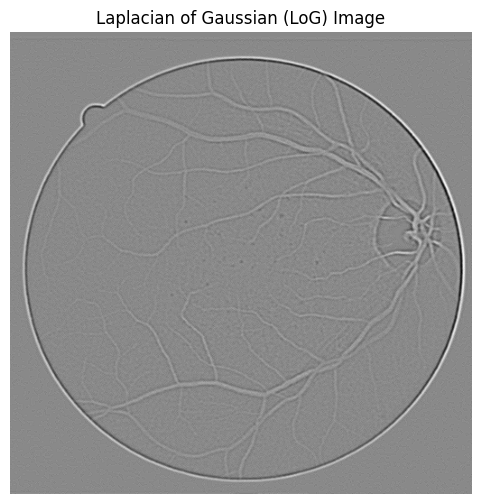

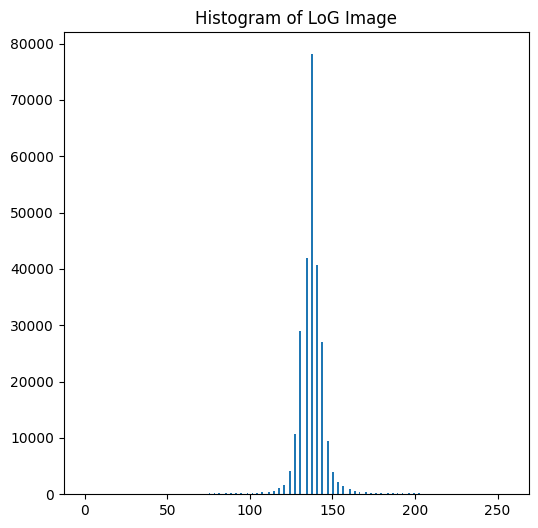

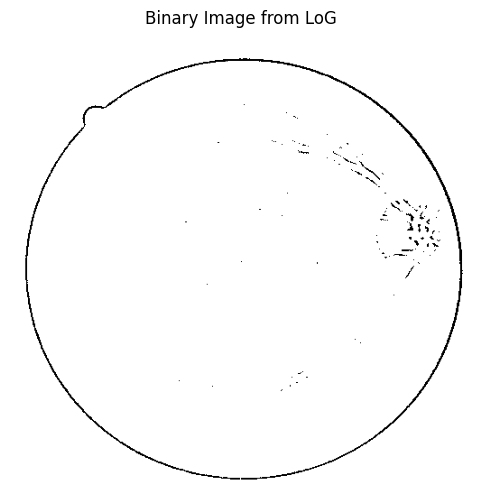

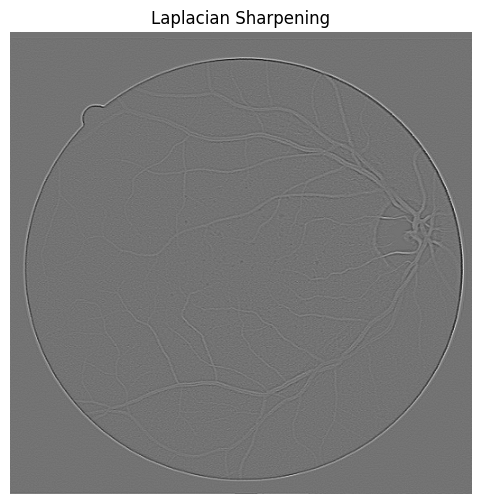

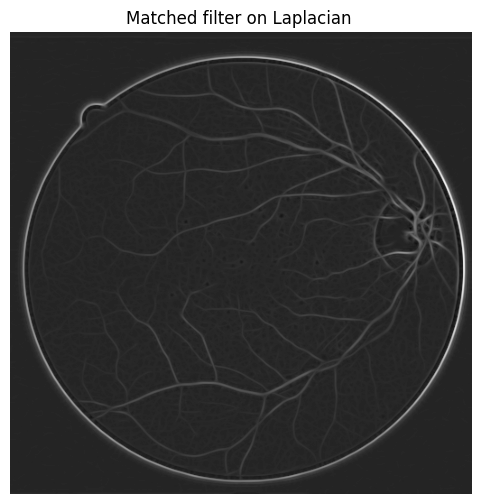

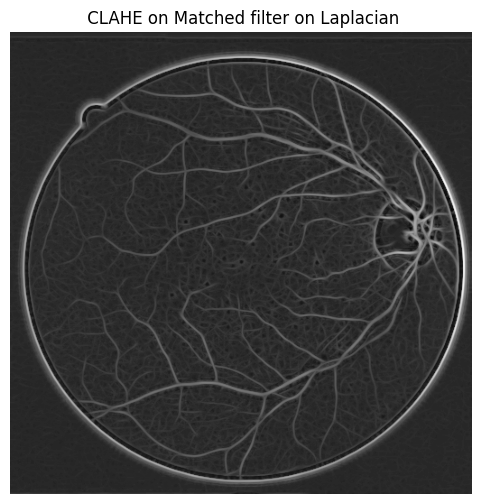

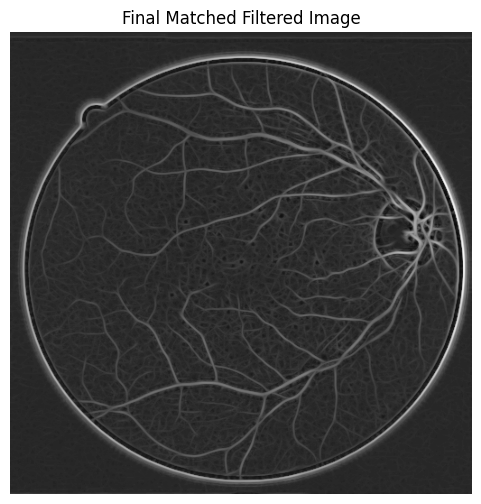

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to plot images
def plot_image(image, title, cmap='gray'):
    plt.figure(figsize=(6, 6))
    plt.title(title)
    plt.imshow(image, cmap=cmap)
    plt.axis('off')
    plt.show()

# Function to plot histogram
def plot_histogram(image):
    plt.figure(figsize=(6, 6))
    plt.hist(image.ravel(), bins=256, range=(0, 256))
    plt.title('Histogram of LoG Image')
    plt.show()

# Function for matched filter
def matched_filter(image, kernel_sizes=[9, 15, 21], sigma=2, num_angles=24):
    filtered_images = []
    for kernel_size in kernel_sizes:
        for angle in range(num_angles):
            theta = np.deg2rad(angle * 180 / num_angles)
            kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
            filtered_image = cv2.filter2D(image, cv2.CV_32F, kernel)
            filtered_images.append(filtered_image)
    return np.max(np.array(filtered_images), axis=0)

# Load image and convert to RGB
image = cv2.imread(r"C:\Users\thooy\Downloads\Evaluation_Set\1.png")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green Channel and apply Gaussian Blur
green_channel = image_rgb[:, :, 1]
gaussian_blur = cv2.GaussianBlur(green_channel, (5, 5), 0)

# Apply Laplacian of Gaussian (LoG)
log_image = cv2.Laplacian(gaussian_blur, cv2.CV_64F)
log_image = np.uint8(255 * (log_image - np.min(log_image)) / (np.max(log_image) - np.min(log_image)))

# Plot LoG image and histogram
plot_image(log_image, 'Laplacian of Gaussian (LoG) Image')
plot_histogram(log_image)

# Convert LoG image to binary using Otsu's thresholding
_, binary_image = cv2.threshold(log_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plot_image(binary_image, 'Binary Image from LoG')

# Apply CLAHE to LoG image
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
log_clahe = cv2.Laplacian(green_channel, cv2.CV_64F)#clahe.apply(log_image)#
plot_image(log_clahe, 'Laplacian Sharpening')

# Apply matched filter to CLAHE image
log_clahe_matched = matched_filter(log_clahe)
plot_image(log_clahe_matched, 'Matched filter on Laplacian ')

# Ensure the matched filtered image is in uint8 format
if len(log_clahe_matched.shape) == 3:
    log_clahe_matched = cv2.cvtColor(log_clahe_matched, cv2.COLOR_BGR2GRAY)
if log_clahe_matched.dtype != np.uint8:
    log_clahe_matched = cv2.normalize(log_clahe_matched, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Apply CLAHE again to matched filtered image
log_clahe_matched_clahe = clahe.apply(log_clahe_matched)
plot_image(log_clahe_matched_clahe, ' CLAHE on Matched filter on Laplacian')

# Normalize the final matched filtered image
matched_filtered_image = cv2.normalize(log_clahe_matched_clahe, None, 0, 255, cv2.NORM_MINMAX)
plot_image(matched_filtered_image, 'Final Matched Filtered Image')

inverted=cv2.bitwise_not(matched_filtered_image)


C:\Users\thooy\AppData\Local\Temp\ipykernel_94292\459041998.py:36: RuntimeWarning: overflow encountered in scalar subtract
  cii = (contrast_processed - contrast_original) / contrast_original if contrast_original != 0 else 0


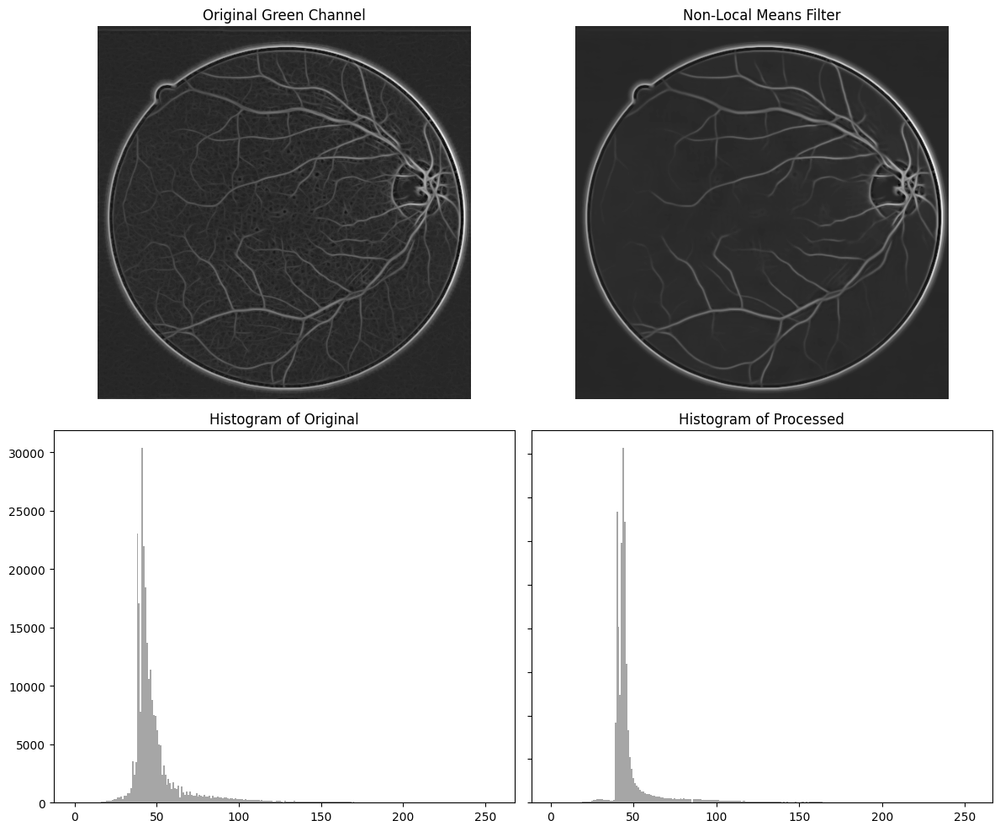

Non-Local Means Filter Metrics:
Contrast Improvement Index (CII): 0.9961
Peak Signal-to-Noise Ratio (PSNR): 35.7230 dB
Entropy: 4.5445



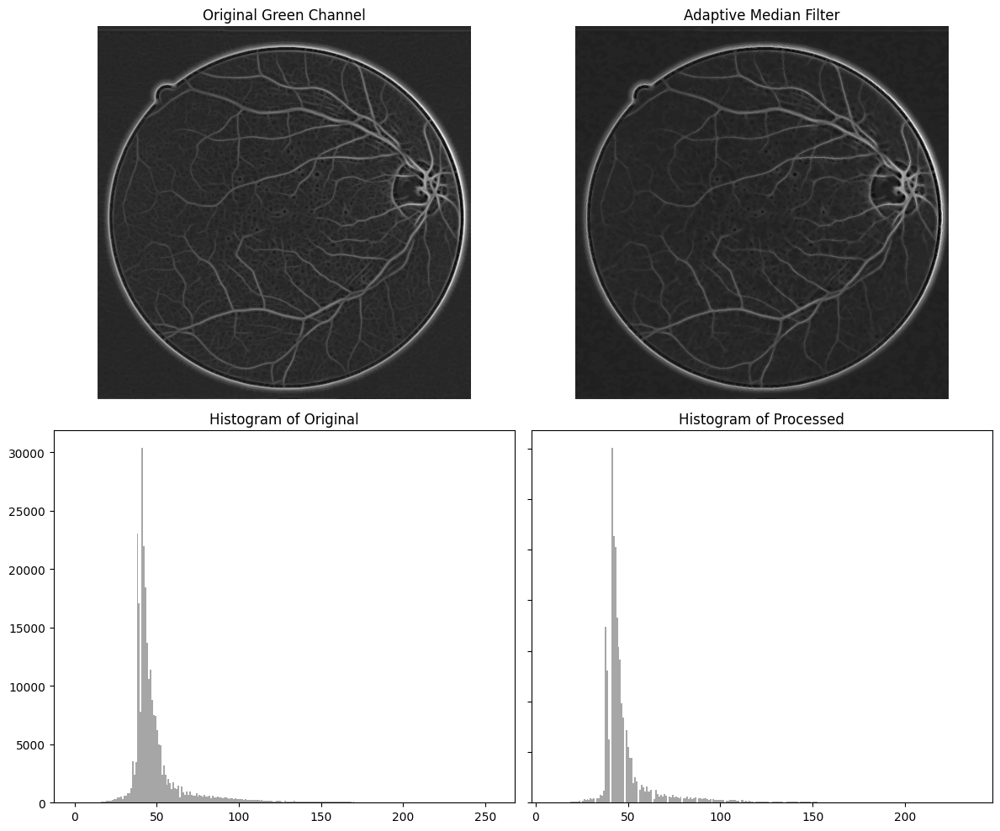

Adaptive Median Filter Metrics:
Contrast Improvement Index (CII): 0.8941
Peak Signal-to-Noise Ratio (PSNR): 36.2996 dB
Entropy: 4.8955



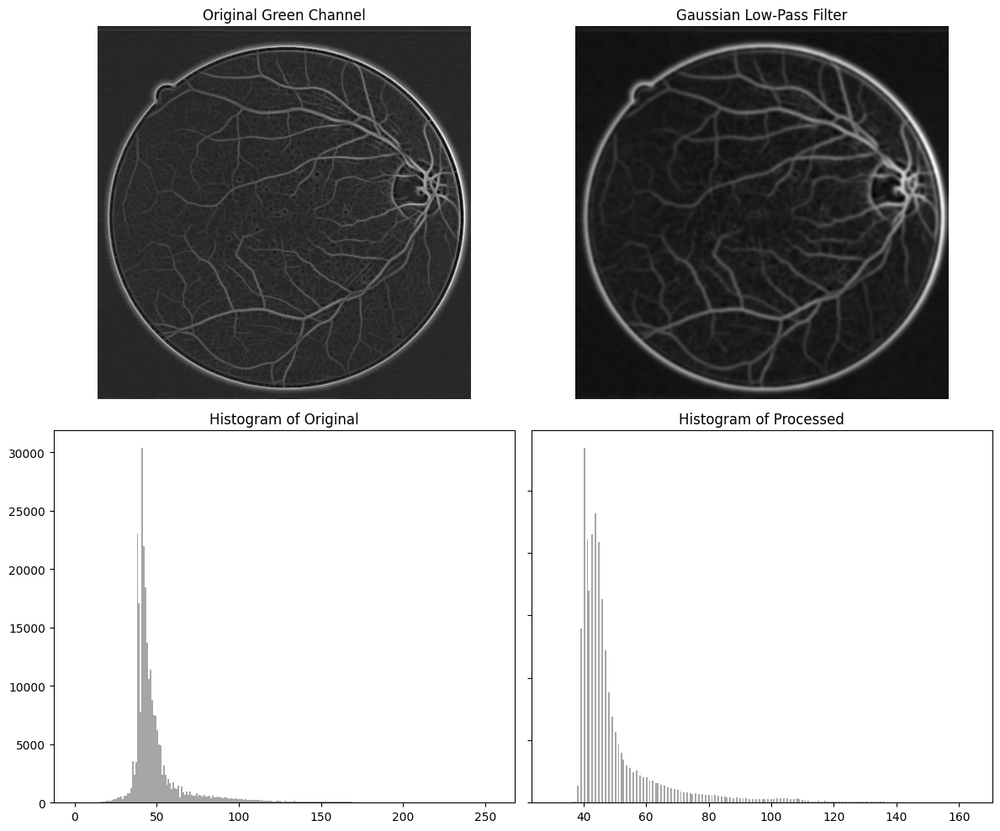

Gaussian Low-Pass Filter Metrics:
Contrast Improvement Index (CII): 0.5294
Peak Signal-to-Noise Ratio (PSNR): 33.3870 dB
Entropy: 4.8364



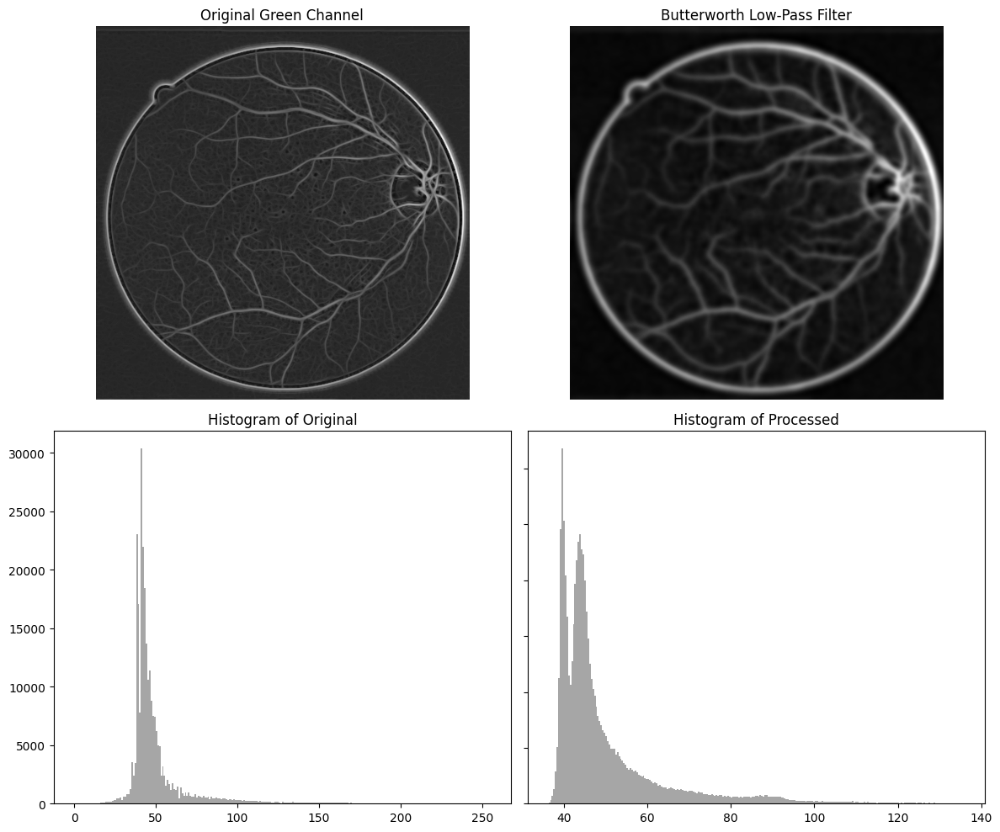

Butterworth Low-Pass Filter Metrics:
Contrast Improvement Index (CII): -0.6095
Peak Signal-to-Noise Ratio (PSNR): 24.8714 dB
Entropy: 4.8951



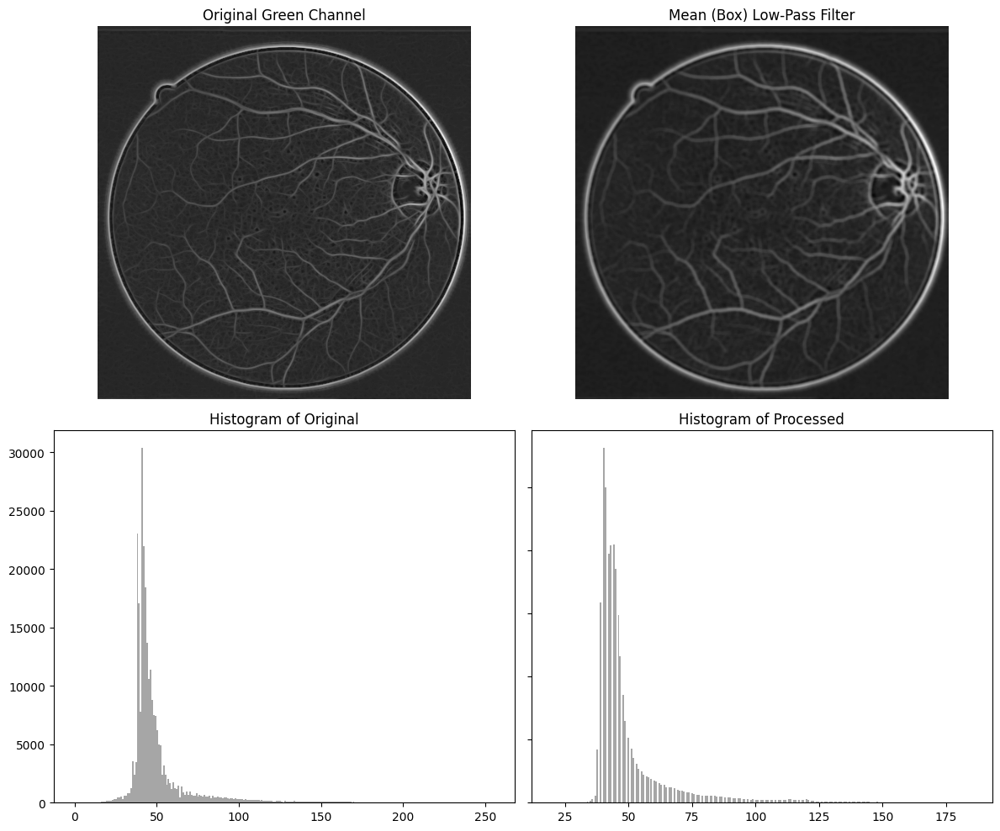

Mean (Box) Low-Pass Filter Metrics:
Contrast Improvement Index (CII): 0.6510
Peak Signal-to-Noise Ratio (PSNR): 33.7866 dB
Entropy: 4.8810



In [58]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter

# Load the image and extract the green channel
image = cv2.imread('input_image.jpg')
green_channel = matched_filtered_image

# Function to calculate contrast
def calculate_contrast(image):
    return image.max() - image.min()

# Function to calculate PSNR
def calculate_psnr(original, filtered):
    mse = np.mean((original - filtered) ** 2)
    if mse == 0:
        return 100  # PSNR is infinite for identical images
    max_i = 255.0
    psnr = 10 * np.log10((max_i ** 2) / mse)
    return psnr

# Function to calculate Entropy
def calculate_entropy(image):
    histogram, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])
    histogram = histogram[histogram > 0]  # Ignore zero entries
    probabilities = histogram / histogram.sum()
    entropy = -np.sum(probabilities * np.log2(probabilities))
    return entropy

# Function to display results and metrics
def display_results(original, processed, title):
    # Calculate metrics
    contrast_original = calculate_contrast(original)
    contrast_processed = calculate_contrast(processed)
    cii = (contrast_processed - contrast_original) / contrast_original if contrast_original != 0 else 0
    psnr = calculate_psnr(original, processed)
    entropy = calculate_entropy(processed)

    # Display the original and processed images
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    
    # Original Green Channel
    axs[0, 0].imshow(original, cmap='gray')
    axs[0, 0].set_title('Original Green Channel')
    axs[0, 0].axis('off')

    # Processed Image
    axs[0, 1].imshow(processed, cmap='gray')
    axs[0, 1].set_title(title)
    axs[0, 1].axis('off')
    
    # Histograms
    axs[1, 0].hist(original.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 0].set_title('Histogram of Original')
    
    axs[1, 1].hist(processed.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 1].set_title('Histogram of Processed')

    for ax in axs.flat:
        ax.label_outer()

    plt.tight_layout()
    plt.show()

    # Print metrics
    print(f"{title} Metrics:")
    print(f"Contrast Improvement Index (CII): {cii:.4f}")
    print(f"Peak Signal-to-Noise Ratio (PSNR): {psnr:.4f} dB")
    print(f"Entropy: {entropy:.4f}\n")

# 1. Non-Local Means Filter
non_local_means_filtered = cv2.fastNlMeansDenoising(green_channel, None, h=10, templateWindowSize=7, searchWindowSize=21)
display_results(green_channel, non_local_means_filtered, 'Non-Local Means Filter')

# 2. Adaptive Median Filter
def adaptive_median_filter(image, max_size=7):
    # Initialize the output image
    filtered_image = np.copy(image)
    # Loop over increasing filter sizes
    for size in range(3, max_size + 1, 2):
        # Apply median filter
        median_filtered = median_filter(image, size=size)
        # Mask where the pixel intensity equals the original image
        mask = (image == filtered_image)
        # Update only masked regions with the new median values
        filtered_image[mask] = median_filtered[mask]
    return filtered_image

adaptive_median_filtered = adaptive_median_filter(green_channel)
display_results(green_channel, adaptive_median_filtered, 'Adaptive Median Filter')

# 3. Gaussian Low-Pass Filter
def gaussian_low_pass(image, sigma=1.0):
    return cv2.GaussianBlur(image, (0, 0), sigma)

gaussian_filtered = gaussian_low_pass(green_channel, sigma=2.0)
display_results(green_channel, gaussian_filtered, 'Gaussian Low-Pass Filter')

# 4. Butterworth Low-Pass Filter
def butterworth_low_pass(image, cutoff_frequency=30, order=2):
    # Create the filter
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    X, Y = np.ogrid[:rows, :cols]
    D = np.sqrt((X - crow) ** 2 + (Y - ccol) ** 2)
    H = 1 / (1 + (D / cutoff_frequency) ** (2 * order))
    
    # Apply filter in frequency domain
    f_image = np.fft.fft2(image)
    f_image_shifted = np.fft.fftshift(f_image)
    f_filtered = f_image_shifted * H
    filtered_image = np.fft.ifftshift(f_filtered)
    filtered_image = np.fft.ifft2(filtered_image)
    
    return np.abs(filtered_image)

butterworth_filtered = butterworth_low_pass(green_channel)
display_results(green_channel, butterworth_filtered, 'Butterworth Low-Pass Filter')

# 5. Mean (Box) Low-Pass Filter
def mean_filter(image, kernel_size=5):
    kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)
    return cv2.filter2D(image, -1, kernel)

mean_filtered = mean_filter(green_channel)
display_results(green_channel, mean_filtered, 'Mean (Box) Low-Pass Filter')


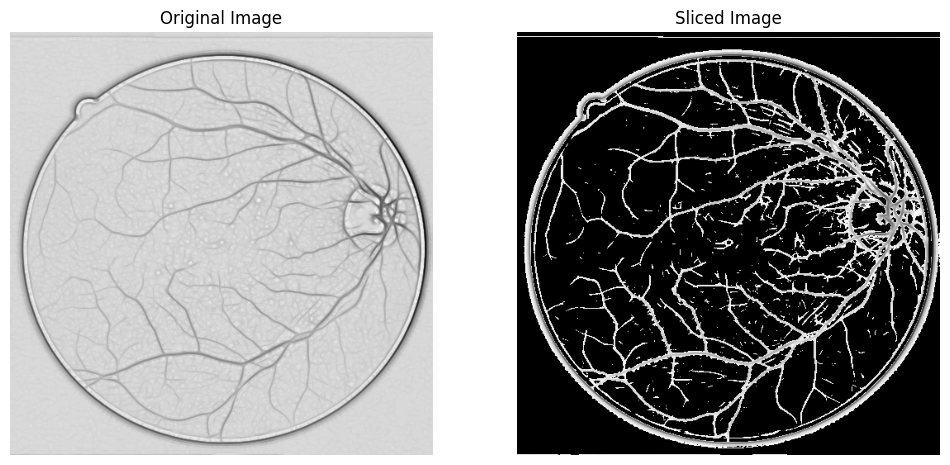

In [128]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = matched_filtered_image
image=cv2.bitwise_not(image)
# Define the gray level range
lower_gray_level = 0  # Adjust this value
upper_gray_level = 200# Adjust this value

# Create a mask based on the defined gray level range
mask = (image >= lower_gray_level) & (image <= upper_gray_level)

# Create a new image where only the sliced region is visible
sliced_image = np.zeros_like(image)
sliced_image[mask] = image[mask]

# Display the original and sliced images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sliced_image, cmap='gray')
plt.title('Sliced Image')
plt.axis('off')

plt.show()


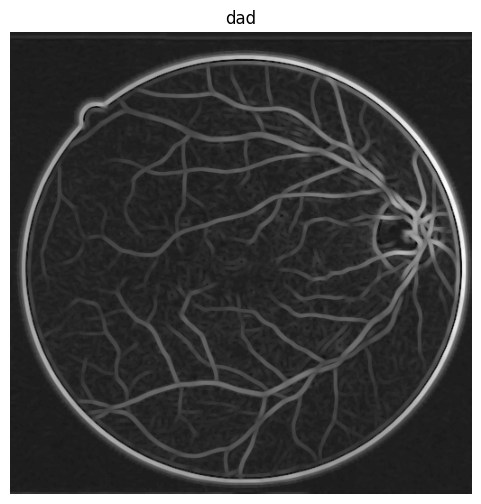

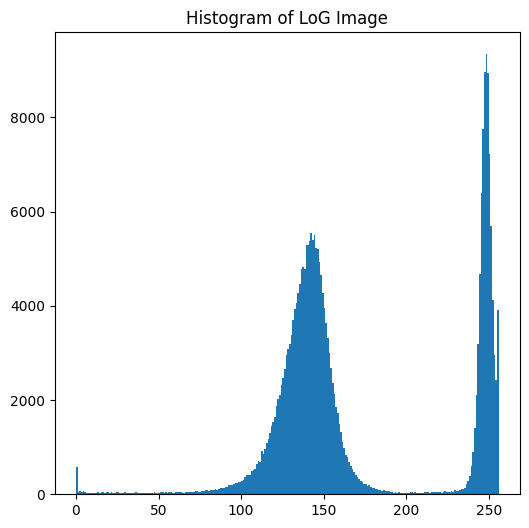

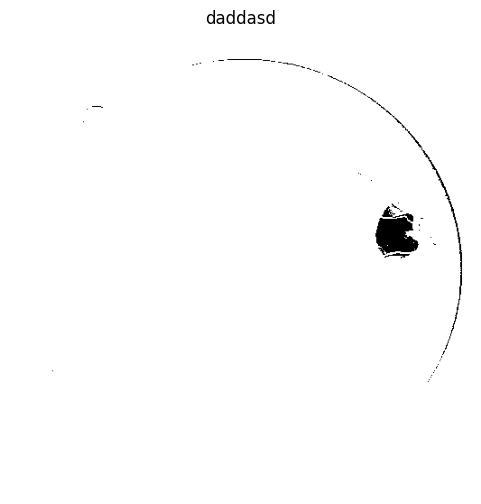

In [151]:
kernel = np.ones((3,3), np.uint8)
dilated_img = cv2.dilate(matched_filtered_image, kernel, iterations=1)
plot_image(dilated_img,"dad")
_, thresholded_img = cv2.threshold(dilated_img, 65, 255, cv2.THRESH_BINARY)
plot_image(thresholded_img,"daddasd")

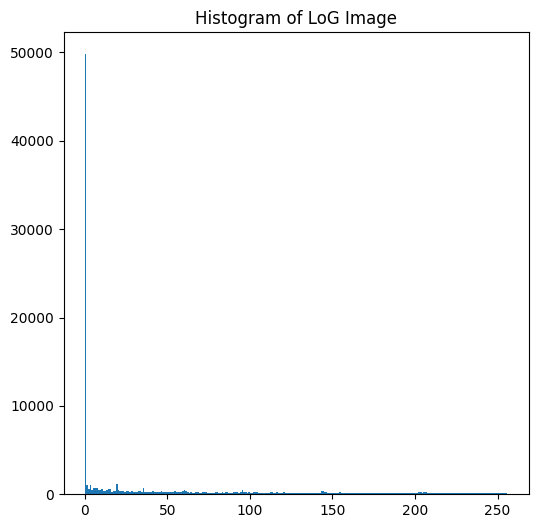

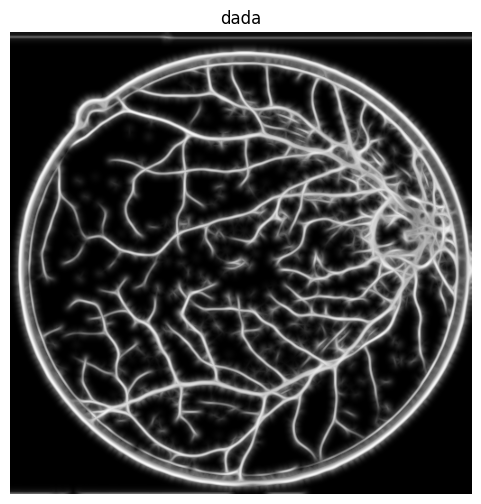

In [124]:

image_idk=matched_filter(sliced_image)
plot_histogram(image_idk)
plot_image(image_idk,"dada")

In [116]:
_, binary_mask = cv2.threshold(sliced_image, 100, 255, cv2.THRESH_BINARY)

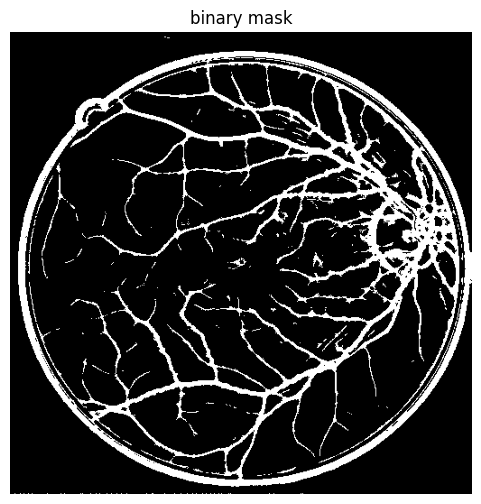

In [117]:
plot_image(binary_mask,"binary mask")

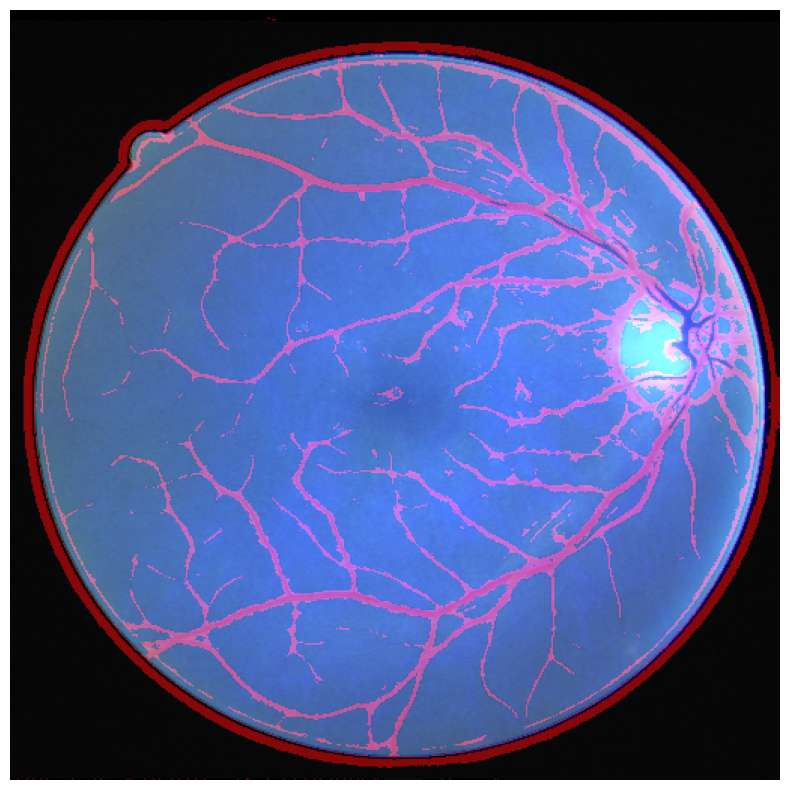

In [115]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_mask_with_color(image, mask, color=(255, 0, 0)):
    # Read the image and maska
    
    
    # Ensure the mask is binary (0 or 255)
    #_, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    
    # Create a color version of the mask (same size as the original image)
    color_mask = np.zeros_like(image)
    color_mask[mask == 255] = color  # Apply color to the masked region

    # Apply the mask on the image
    masked_image = cv2.addWeighted(image, 1, color_mask, 0.5, 0)

    # Convert the result to RGB for display (OpenCV uses BGR by default)
    masked_image_rgb = cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB)
    
    # Display the result
    plt.figure(figsize=(10, 10))
    plt.imshow(masked_image_rgb)
    plt.axis('off')  # Hide the axes
    plt.show()

# Example usage
apply_mask_with_color(image_rgb, binary_mask, color=(0, 0, 255))  # Apply green color to the masked area


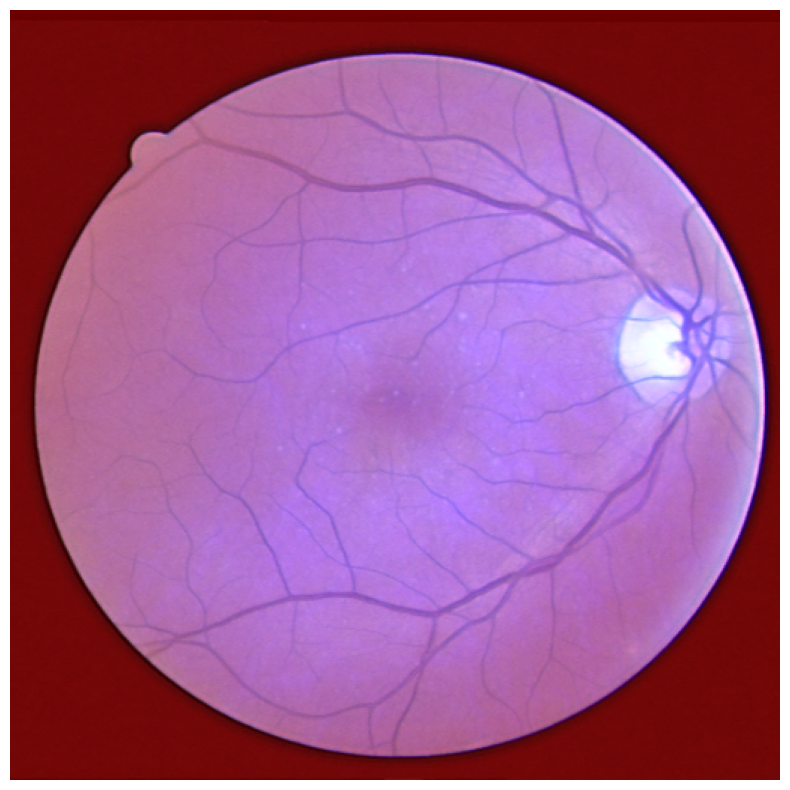

In [122]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_gradient_mask_with_color(image, mask, color=(255, 0, 0)):
    # Read the image and mask
    

    # Normalize the mask to [0, 1]
    mask_normalized = mask / 255.0
    
    # Create a color version of the mask (using the given color)
    color_mask = np.zeros_like(image, dtype=np.float32)
    for i in range(3):  # Apply the color intensity to each channel (R, G, B)
        color_mask[:, :, i] = mask_normalized * color[i]

    # Combine the color mask with the original image (using weighted sum)
    color_mask = color_mask.astype(np.uint8)
    masked_image = cv2.addWeighted(image, 1, color_mask, 0.5, 0)

    # Convert to RGB for display (OpenCV uses BGR by default)
    masked_image_rgb = cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB)

    # Display the result
    plt.figure(figsize=(10, 10))
    plt.imshow(masked_image_rgb)
    plt.axis('off')  # Hide the axes
    plt.show()

# Example usage
apply_gradient_mask_with_color(image_rgb, ada, color=(0, 0,255))  # Apply green color with mask intensity


In [62]:
inverted_sliced_image=cv2.bitwise_not(sliced_image)

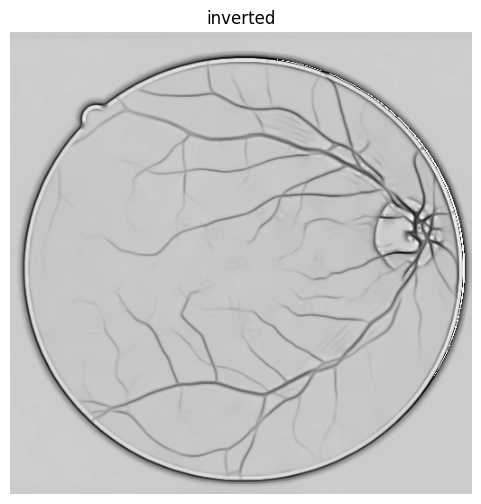

In [63]:
plot_image(inverted_sliced_image,"inverted")

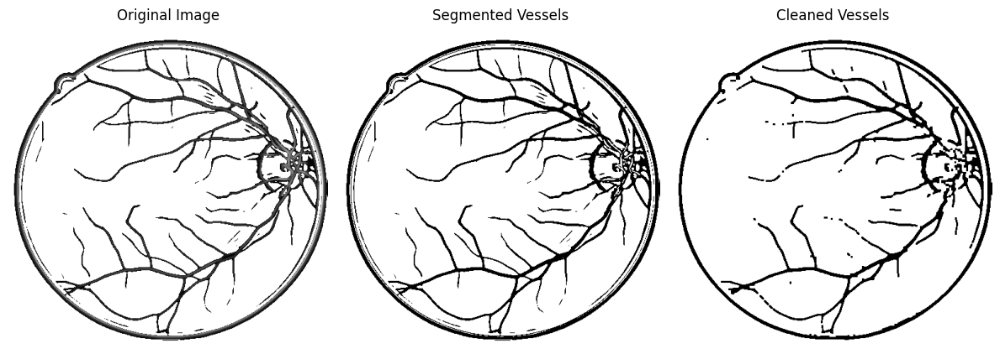

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (replace 'path_to_image.jpg' with your image path)
image_path = 'path_to_image.jpg'  # Update this to your image path
matched_filtered_image = inverted_sliced_image

if matched_filtered_image is None:
    print("Error: Unable to load image.")
else:
    # Apply adaptive thresholding
    vessels_segmented = cv2.adaptiveThreshold(
        matched_filtered_image.astype(np.uint8), 
        255, 
        cv2.ADAPTIVE_THRESH_MEAN_C, 
        cv2.THRESH_BINARY, 
        11, 
        2
    )

    # Morphological operations to clean up the segmentation
    kernel = np.ones((3, 3), np.uint8)
    vessels_cleaned = cv2.morphologyEx(vessels_segmented, cv2.MORPH_CLOSE, kernel)
    vessels_cleaned = cv2.morphologyEx(vessels_cleaned, cv2.MORPH_OPEN, kernel)

    # Display the results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(matched_filtered_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Segmented Vessels')
    plt.imshow(vessels_segmented, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Cleaned Vessels')
    plt.imshow(vessels_cleaned, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


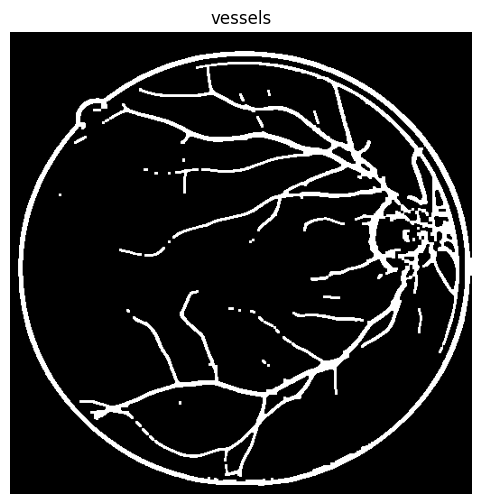

In [37]:
vessels_cleaned=cv2.bitwise_not(vessels_cleaned)
plot_image(vessels_cleaned,"vessels")

In [109]:
height, width = vessels_cleaned.shape[:2]

# Create a black mask
mask = np.zeros((height, width), dtype=np.uint8)

# Define the center and radius of the circle
center = ((width) // 2, (height+10) // 2)  # Center of the image
radius = min(center) - 20  # Adjust the radius as needed

# Draw a filled circle on the mask
cv2.circle(mask, center, radius, (255), thickness=-1)

# Apply the mask to the image
result = cv2.bitwise_or(vessels_cleaned, vessels_cleaned, mask=mask)

# Show the result
cv2.imshow('Masked Image', result)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Optionally, save the result
cv2.imwrite('masked_image.jpg', result)

True

**LOG CLAHE MATHCED DILATION **

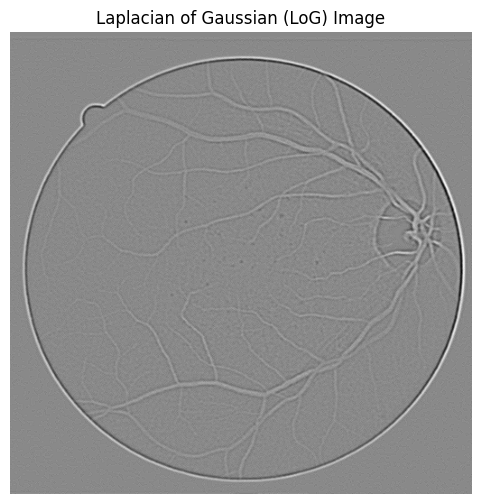

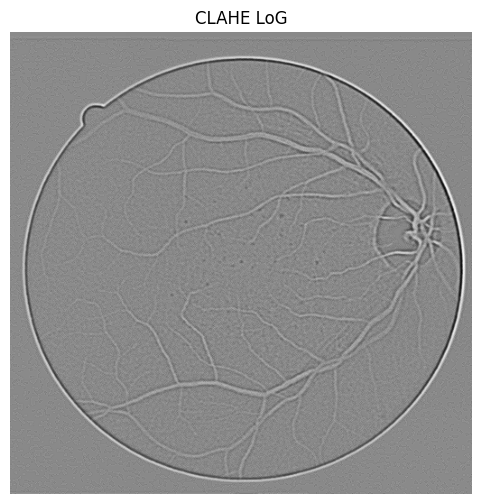

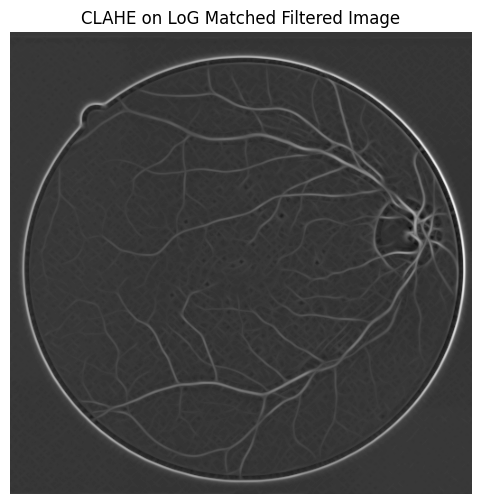

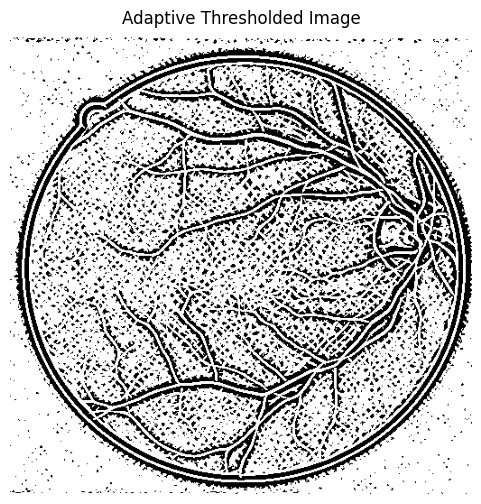

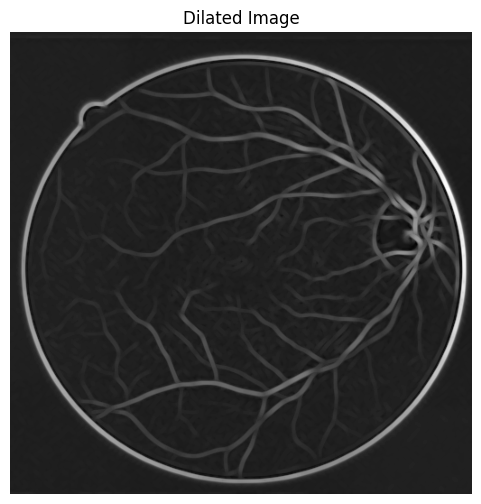

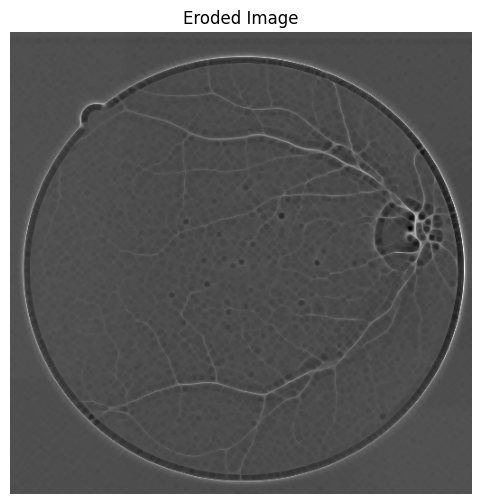

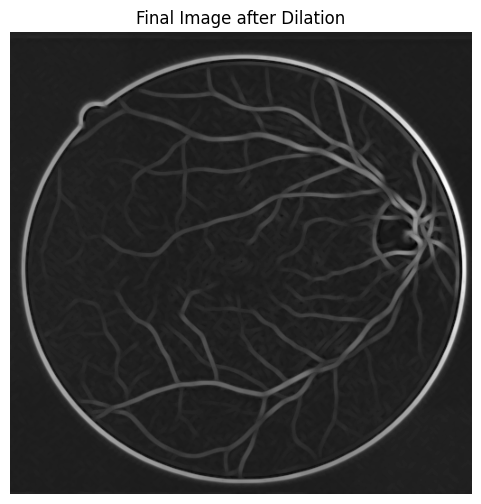

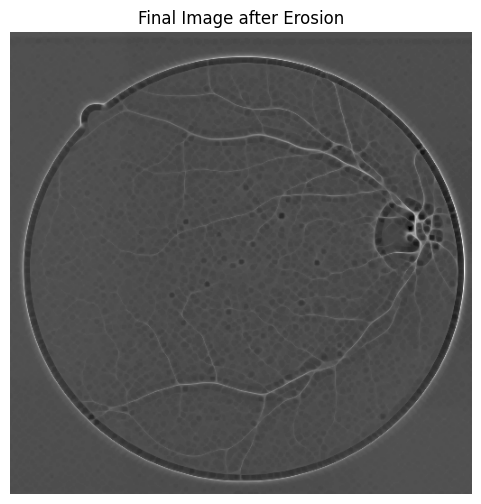

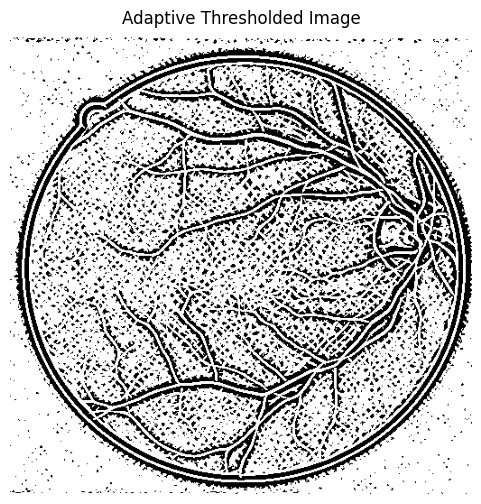

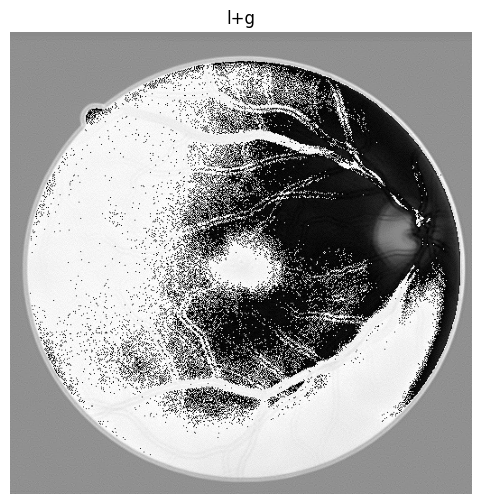

In [52]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to plot images
def plot_image(image, title, cmap='gray'):
    plt.figure(figsize=(6, 6))
    plt.title(title)
    plt.imshow(image, cmap=cmap)
    plt.axis('off')
    plt.show()

# Function for matched filter
def matched_filter(image, kernel_sizes=[9, 15, 21], sigma=2, num_angles=24):
    filtered_images = []
    for kernel_size in kernel_sizes:
        for angle in range(num_angles):
            theta = np.deg2rad(angle * 180 / num_angles)
            kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
            filtered_image = cv2.filter2D(image, cv2.CV_32F, kernel)
            filtered_images.append(filtered_image)
    return np.max(np.array(filtered_images), axis=0)

# Load image and convert to RGB
image = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green Channel and apply Gaussian Blur
green_channel = image_rgb[:, :, 1]
gaussian_blur = cv2.GaussianBlur(green_channel, (5, 5), 0)

# Step 1: Apply Laplacian of Gaussian (LoG)
log_image = cv2.Laplacian(gaussian_blur, cv2.CV_64F)
log_image = np.uint8(255 * (log_image - np.min(log_image)) / (np.max(log_image) - np.min(log_image)))
plot_image(log_image, 'Laplacian of Gaussian (LoG) Image')

# Step 2: Apply CLAHE to LoG image
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
log_clahe = clahe.apply(log_image)
plot_image(log_clahe, 'CLAHE LoG')

# Step 3: Apply matched filter to CLAHE image
log_clahe_matched = matched_filter(log_clahe)
log_clahe_matched = cv2.normalize(log_clahe_matched, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
plot_image(log_clahe_matched, 'CLAHE on LoG Matched Filtered Image')

# Step 4: Adaptive Filtering
adaptive_thresh = cv2.adaptiveThreshold(log_clahe_matched, 255,
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                         cv2.THRESH_BINARY, 11, 2)
plot_image(adaptive_thresh, 'Adaptive Thresholded Image')

# Step 5: Morphological Operations
kernel = np.ones((3, 3), np.uint8)
dilated_image = cv2.dilate(log_clahe_matched, kernel, iterations=1)
eroded_image = cv2.erode(log_clahe_matched, kernel, iterations=1)

plot_image(dilated_image, 'Dilated Image')
plot_image(eroded_image, 'Eroded Image')

# Finalize the output images
final_dilated = cv2.normalize(dilated_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
final_eroded = cv2.normalize(eroded_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Plot final results after morphological operations
plot_image(final_dilated, 'Final Image after Dilation')
plot_image(final_eroded, 'Final Image after Erosion')
plot_image(adaptive_thresh, 'Adaptive Thresholded Image')

image_added=green_channel+log_image

plot_image(image_added,"l+g")

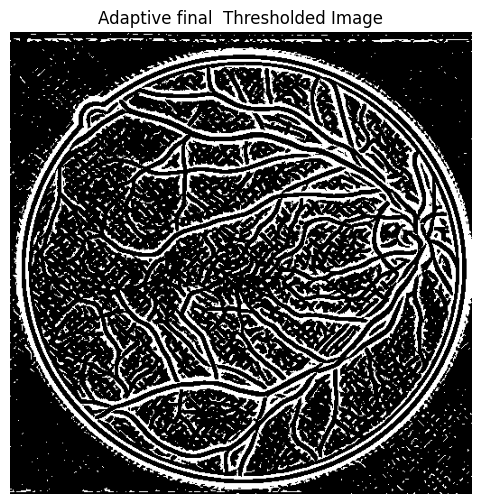

In [50]:
final_dilated_inverted=cv2.bitwise_not(final_dilated)
adaptive_thresh = cv2.adaptiveThreshold(final_dilated, 255,
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                         cv2.THRESH_BINARY, 11, 2)
plot_image(adaptive_thresh, 'Adaptive final  Thresholded Image')



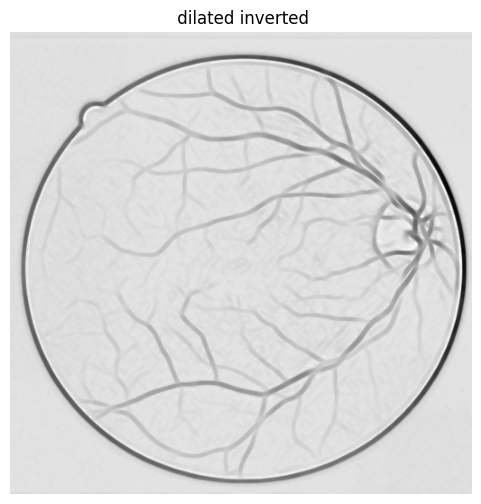

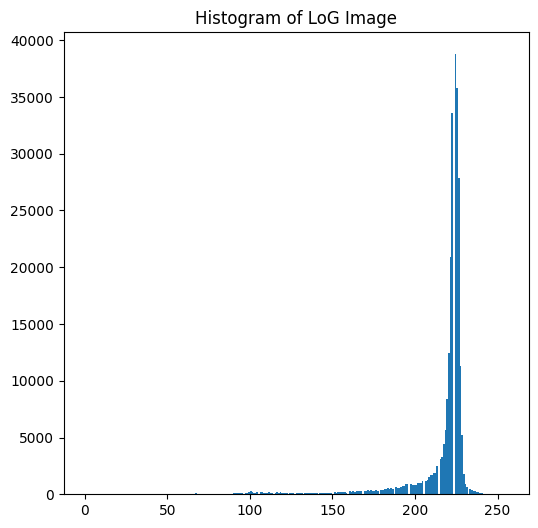

In [41]:
final_dilated_inverted=cv2.bitwise_not(final_dilated)

plot_image(final_dilated_inverted," dilated inverted")
plot_histogram(final_dilated_inverted)

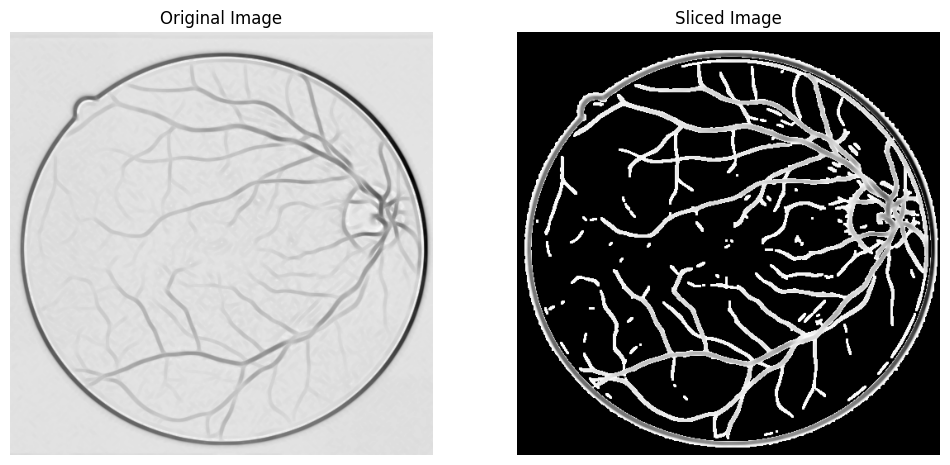

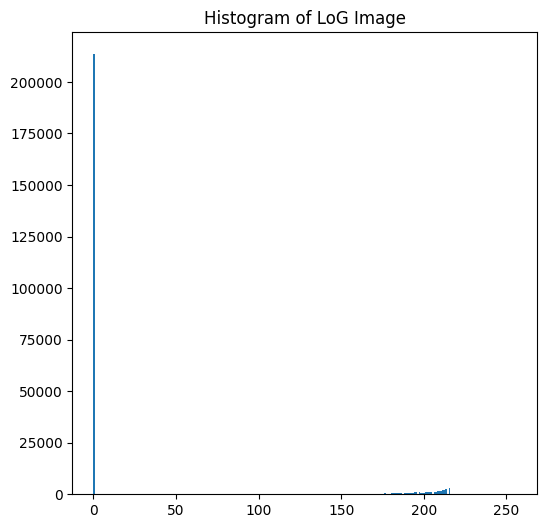

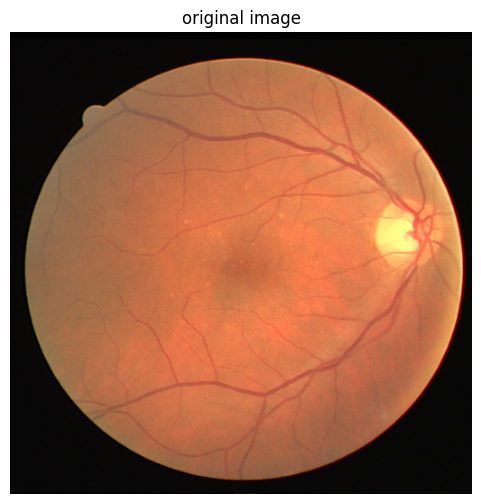

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = final_dilated_inverted

# Define the gray level range
lower_gray_level = 0  # Adjust this value
upper_gray_level = 215 # Adjust this value

# Create a mask based on the defined gray level range
mask = (image >= lower_gray_level) & (image <= upper_gray_level)

# Create a new image where only the sliced region is visible
sliced_image = np.zeros_like(image)
sliced_image[mask] = image[mask]

# Display the original and sliced images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sliced_image, cmap='gray')
plt.title('Sliced Image')
plt.axis('off')

plt.show()

plot_histogram(sliced_image)
plot_image(image_rgb,"original image")

In [149]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to plot images
def plot_image(image, title, cmap='gray'):
    plt.figure(figsize=(6, 6))
    plt.title(title)
    plt.imshow(image, cmap=cmap)
    plt.axis('off')
    plt.show()

# Function for matched filter
def matched_filter(image, kernel_sizes=[9, 15, 21], sigma=2, num_angles=24):
    filtered_images = []
    for kernel_size in kernel_sizes:
        for angle in range(num_angles):
            theta = np.deg2rad(angle * 180 / num_angles)
            kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
            filtered_image = cv2.filter2D(image, cv2.CV_32F, kernel)
            filtered_images.append(filtered_image)
    return np.max(np.array(filtered_images), axis=0)

# Function to process the image
def process_image(image_rgb):
    # Load image and convert to RGB

    # Extract Green Channel and apply Gaussian Blur
    green_channel = image_rgb[:, :, 1]
    gaussian_blur = cv2.GaussianBlur(green_channel, (5, 5), 0)

    # Step 1: Apply Laplacian of Gaussian (LoG)
    log_image = cv2.Laplacian(gaussian_blur, cv2.CV_64F)
    log_image = np.uint8(255 * (log_image - np.min(log_image)) / (np.max(log_image) - np.min(log_image)))
    #plot_image(log_image, 'Laplacian of Gaussian (LoG) Image')

    # Step 2: Apply CLAHE to LoG image
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
    log_clahe = clahe.apply(log_image)
    #plot_image(log_clahe, 'CLAHE LoG')

    # Step 3: Apply matched filter to CLAHE image
    log_clahe_matched = matched_filter(log_clahe)
    log_clahe_matched = cv2.normalize(log_clahe_matched, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    #plot_image(log_clahe_matched, 'CLAHE LoG Matched Filtered Image')

    # Step 4: Adaptive Filtering
    #plot_image(adaptive_thresh, 'Adaptive Thresholded Image')

    # Step 5: Morphological Operations
    kernel = np.ones((3, 3), np.uint8)
    dilated_image = cv2.dilate(log_clahe_matched, kernel, iterations=1)
    eroded_image = cv2.erode(log_clahe_matched, kernel, iterations=1)

    #plot_image(dilated_image, 'Dilated Image')
    #plot_image(eroded_image, 'Eroded Image')

    # Finalize the output images
    final_dilated = cv2.normalize(dilated_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    final_eroded = cv2.normalize(eroded_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    lower_threshold=0
    upper_threshold=215
    # Invert the dilated image
    
    final_dilated_inverted = cv2.bitwise_not(final_dilated)
    mask=(final_dilated_inverted >= lower_threshold) & (final_dilated_inverted <= upper_threshold)#cv2.bitwise_not(final_dilated)
    
    sliced_image = np.zeros_like(final_dilated_inverted)
    sliced_image[mask] = final_dilated_inverted[mask]

    # Plot final results after morphological operations
    #plot_image(final_dilated_inverted, "Final Dilated Inverted Image")

    return sliced_image




In [150]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import jaccard_score

# Function to process image and return mask
def process_image_to_mask(image):
    # Placeholder for image processing logic
    processed_mask = process_image(image)
    return processed_mask

# Paths for folders
image_folder = r"C:\projects\ip\Data\train\image"
mask_folder = r"C:\projects\ip\Data\train\mask"
save_folder = r"C:\projects\ip\Data\train\processed"

# Create folder to save processed masks if it doesn't exist
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

# Evaluation metrics
def evaluate_masks(ground_truth, predicted):
    # Binarize the masks (assuming they are not binary yet)
    ground_truth_bin = (ground_truth > 127).astype(np.uint8)  # Threshold for binary
    predicted_bin = (predicted > 127).astype(np.uint8)        # Same threshold

    # Dice Coefficient or F1 Score
    intersection = np.sum(ground_truth_bin * predicted_bin)
    dice_coeff = (2 * intersection) / (np.sum(ground_truth_bin) + np.sum(predicted_bin))
    
    # Intersection over Union (IoU)
    iou = jaccard_score(ground_truth_bin.flatten(), predicted_bin.flatten(), average='binary')

    # SSIM
    ssim_score = ssim(ground_truth, predicted)
    
    # PSNR
    psnr = cv2.PSNR(ground_truth, predicted)
    
    return dice_coeff, iou, ssim_score, psnr

# Process images and compare with ground truth masks
for image_file in os.listdir(image_folder):
    # Load image and corresponding ground truth mask
    image_path = os.path.join(image_folder, image_file)
    ground_truth_path = os.path.join(mask_folder, image_file)
    
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    ground_truth_mask = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALEW)
    
    # Generate processed mask
    processed_mask = process_image_to_mask(image)
    
    # Save processed mask
    save_path = os.path.join(save_folder, image_file)
    cv2.imwrite(save_path, processed_mask)
    
    # Evaluate masks
    dice, iou, ssim_val, psnr_val = evaluate_masks(ground_truth_mask, processed_mask)
    print(f"Metrics for {image_file}: Dice = {dice:.4f}, IoU = {iou:.4f}, SSIM = {ssim_val:.4f}, PSNR = {psnr_val:.2f}")



Metrics for 0.png: Dice = 0.5636, IoU = 0.3924, SSIM = 0.6634, PSNR = 11.87
Metrics for 1.png: Dice = 0.5634, IoU = 0.3922, SSIM = 0.6633, PSNR = 11.87
Metrics for 10.png: Dice = 0.4957, IoU = 0.3295, SSIM = 0.6603, PSNR = 11.41
Metrics for 11.png: Dice = 0.3717, IoU = 0.2282, SSIM = 0.4633, PSNR = 8.73
Metrics for 12.png: Dice = 0.6106, IoU = 0.4395, SSIM = 0.5866, PSNR = 10.80
Metrics for 13.png: Dice = 0.6270, IoU = 0.4567, SSIM = 0.6029, PSNR = 11.17
Metrics for 14.png: Dice = 0.6270, IoU = 0.4566, SSIM = 0.6029, PSNR = 11.17
Metrics for 15.png: Dice = 0.5661, IoU = 0.3948, SSIM = 0.5345, PSNR = 9.87
Metrics for 16.png: Dice = 0.1813, IoU = 0.0997, SSIM = -0.0087, PSNR = 2.65
Metrics for 17.png: Dice = 0.1826, IoU = 0.1005, SSIM = -0.0071, PSNR = 2.68
Metrics for 18.png: Dice = 0.1812, IoU = 0.0997, SSIM = -0.0085, PSNR = 2.64
Metrics for 19.png: Dice = 0.2344, IoU = 0.1327, SSIM = 0.0530, PSNR = 4.14
Metrics for 2.png: Dice = 0.5634, IoU = 0.3922, SSIM = 0.6633, PSNR = 11.87
Metri